<a href="https://colab.research.google.com/github/RyC37/Emotional-Status-with-Wearable-Data/blob/master/Predict_Valence_Score_for_Current_Users.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Predict Valence Score (Fitbit Data + Survey Data, Stratified Split)

Author: Sicong Zhao

In [0]:
import pandas as pd
import numpy as np
!pip install catboost
import catboost
!pip install shap
import shap
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GroupKFold, StratifiedKFold, cross_validate, cross_val_score, cross_val_predict

# Logistic Regression
from sklearn.linear_model import LinearRegression, Ridge, Lasso, BayesianRidge, SGDRegressor
from sklearn import preprocessing, metrics, svm
# Random Forest
from sklearn.ensemble import RandomForestRegressor

# KNN
from sklearn.neighbors import KNeighborsRegressor

# Decision Tree
from sklearn.tree import DecisionTreeRegressor

# Evaluation
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, confusion_matrix, recall_score, precision_score, f1_score, auc, roc_curve, precision_recall_curve, r2_score, mean_squared_error
import seaborn as sns

# Re-sample
from sklearn.utils import resample

     |████████████████████████████████| 266kB 4.9MB/s 
  Created wheel for shap: filename=shap-0.34.0-cp36-cp36m-linux_x86_64.whl size=383196 sha256=5754b32788832a3682f1a9fbddbce800b81ca50376308b33682be9111a8182d5
  Stored in directory: /root/.cache/pip/wheels/28/7e/28/57bc9fcb77579b0df6561298648249370648c0b91dfe42c8ec
Successfully built shap


In [0]:
pd.set_option('display.max_rows', 1000)

## 1.Load Data

In [0]:
exp = pd.read_csv('exp_steps_hr_sleep_survey.csv')

## 2.EDA (Skip)

Since we have alreaady done this in previous notebook

### (1) Missing Data Detection

In [0]:
missing_rate = exp.isna().sum()/exp.shape[0]
missing_rate

Unnamed: 0                 0.000000
subject                    0.000000
la_p                       0.000324
ha_p                       0.000000
ha_n                       0.000000
la_n                       0.000000
la                         0.000000
p                          0.000000
n                          0.000000
ha                         0.000000
start_survey               0.002595
survey_no                  0.000000
experiment                 0.000000
DATE_x                     0.000000
Period_of_day              0.002595
VALENCE                    0.000324
VALENCE_mean               0.000324
start_survey_5m_ahead      0.002595
start_survey_10m_ahead     0.002595
start_survey_30m_ahead     0.002595
start_survey_1h_ahead      0.002595
start_survey_3h_ahead      0.002595
survey_date                0.002595
subject_id_x               0.232241
step_max                   0.232241
step_min                   0.232241
step_median                0.232241
steps_max_3h               0

In [0]:
# Columns with more than 50% missing
missing_mt_half_col = missing_rate[missing_rate > .5].index.values
missing_mt_half_col

array(['Date', 'Minutes Asleep', 'Minutes Awake', 'Number of Awakenings',
       'Time in Bed', 'DATE_y', 'ID', 'Experiment', 'Start Time',
       'End Time', 'Minutes REM Sleep', 'Minutes Light Sleep',
       'Minutes Deep Sleep', 'Openness', 'Agreeableness', 'Religion'],
      dtype=object)

In [0]:
# Columns with less than 50% missing
missing_lt_half_col = missing_rate[missing_rate <= .3].index.values
missing_lt_half_col

array(['Unnamed: 0', 'subject', 'la_p', 'ha_p', 'ha_n', 'la_n', 'la', 'p',
       'n', 'ha', 'start_survey', 'survey_no', 'experiment', 'DATE_x',
       'Period_of_day', 'VALENCE', 'VALENCE_mean',
       'start_survey_5m_ahead', 'start_survey_10m_ahead',
       'start_survey_30m_ahead', 'start_survey_1h_ahead',
       'start_survey_3h_ahead', 'survey_date', 'subject_id_x', 'step_max',
       'step_min', 'step_median', 'steps_max_3h', 'steps_min_3h',
       'steps_mean_3h', 'steps_var_3h', 'steps_median_3h', 'move_rate_3h',
       'active_rate_3h', 'very_active_rate_3h', 'running_rate_3h',
       'steps_max_1h', 'steps_min_1h', 'steps_mean_1h', 'steps_var_1h',
       'steps_median_1h', 'move_rate_1h', 'active_rate_1h',
       'very_active_rate_1h', 'running_rate_1h', 'steps_max_30m',
       'steps_min_30m', 'steps_mean_30m', 'steps_var_30m',
       'steps_median_30m', 'move_rate_30m', 'active_rate_30m',
       'very_active_rate_30m', 'running_rate_30m', 'steps_max_10m',
       'steps_mi

In [0]:
# Missingness of label
exp[['la_p', 'ha_p', 'ha_n', 'la_n','la', 'p', 'n', 'ha']].isna().sum()

la_p    1
ha_p    0
ha_n    0
la_n    0
la      0
p       0
n       0
ha      0
dtype: int64

### (2) Observe Labels

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f74b832ec18>,
      dtype=object)

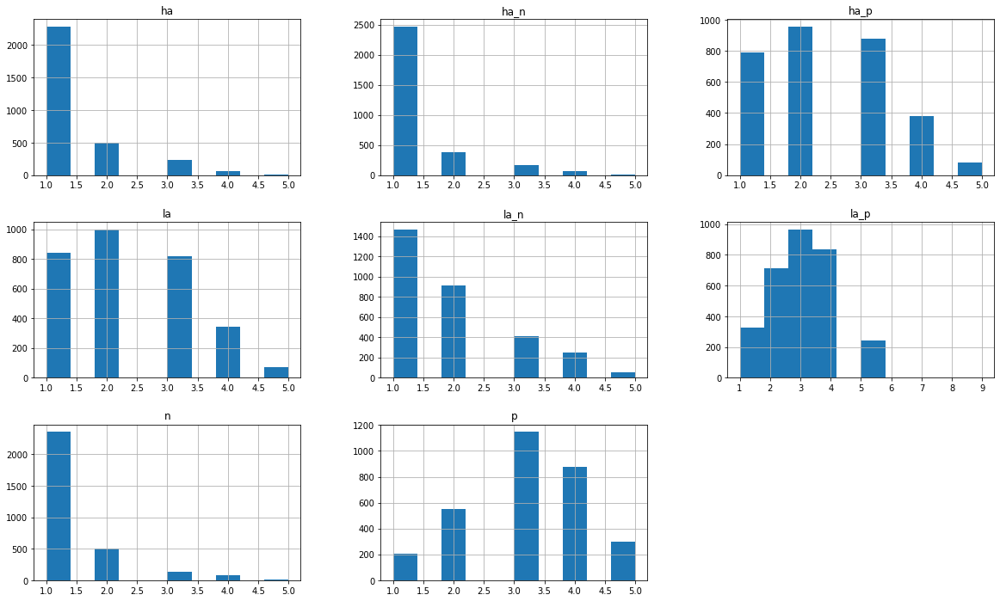

In [0]:
exp[['la_p', 'ha_p', 'ha_n', 'la_n','la', 'p', 'n', 'ha']].hist(figsize=(20,12))

In [0]:
exp[['la_p', 'ha_p', 'ha_n', 'la_n','la', 'p', 'n', 'ha']].describe()

,la_p,ha_p,ha_n,la_n,la,p,n,ha
count,3082.000000,3083.000000,3083.000000,3083.000000,3083.000000,3083.000000,3083.000000,3083.000000
mean,2.985075,2.356471,1.303925,1.866364,2.287707,3.163801,1.343172,1.390204
std,1.118914,1.071917,0.690207,1.030511,1.057988,1.044792,0.719372,0.751720
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,2.000000,1.000000,1.000000,1.000000,1.000000,3.000000,1.000000,1.000000
50%,3.000000,2.000000,1.000000,2.000000,2.000000,3.000000,1.000000,1.000000
75%,4.000000,3.000000,1.000000,2.000000,3.000000,4.000000,1.000000,2.000000
max,9.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


### (3) Observe Positive / Negative Emotion

In [0]:
# 'pn_raw' represent how happy / unhappy the subjects are
exp['pn_raw'] = (exp['la_p'] + exp['p'] + exp['ha_p'])/3 - (exp['la_n'] + exp['n'] + exp['ha_n'])/3

In [0]:
# Ratio of 'pn_raw' < 0
print('pn_raw < 0: ',str(sum(exp['pn_raw'] < 0)/exp.shape[0]))
print('pn_raw = 0: ',str(sum(exp['pn_raw'] == 0)/exp.shape[0]))
print('pn_raw > 0: ',str(sum(exp['pn_raw'] > 0)/exp.shape[0]))

pn_raw < 0:  0.10866039571845605
pn_raw = 0:  0.04573467401881284
pn_raw > 0:  0.8452805708725267


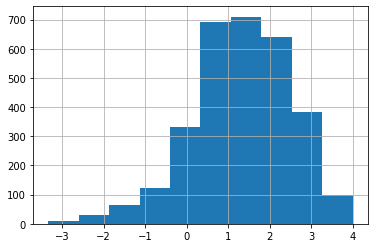

In [0]:
# Histogram of 'pn_raw'
exp['pn_raw'].hist()

## 3.Pre-processing

### (1) Grouping columns for different model
Let's only use predictors with less than 50% missing.

In [0]:
# Update Feature Cols

features_common = ['step_max', 'step_min', 'step_median', 
       
       'steps_max_3h', 'steps_min_3h', 'steps_mean_3h', 'steps_var_3h', 'steps_median_3h', 
       'move_rate_3h', 'active_rate_3h', 'very_active_rate_3h', 'running_rate_3h',
       
       'steps_max_1h', 'steps_min_1h', 'steps_mean_1h', 'steps_var_1h', 'steps_median_1h', 
       'move_rate_1h', 'active_rate_1h', 'very_active_rate_1h', 'running_rate_1h', 
       
       'steps_max_30m', 'steps_min_30m', 'steps_mean_30m', 'steps_var_30m', 'steps_median_30m', 
       'move_rate_30m', 'active_rate_30m', 'very_active_rate_30m', 'running_rate_30m', 
       
       'steps_max_10m', 'steps_min_10m', 'steps_mean_10m', 'steps_var_10m', 'steps_median_10m', 
       'move_rate_10m', 'active_rate_10m', 'very_active_rate_10m', 'running_rate_10m', 
       
       'steps_max_5m', 'steps_min_5m', 'steps_mean_5m', 'steps_var_5m', 'steps_median_5m',
       'move_rate_5m', 'active_rate_5m', 'very_active_rate_5m', 'running_rate_5m', 
       
       'hr_max', 'hr_min', 'hr_med',
       
       'SDNN_3h', 'pHR2_3h', 'rMSSD_3h', 'low_hr_3h', 'high_hr_3h', 'l_h_3h', 'CR_3h', 'hr_mean_3h', 
       'hr_var_3h', 'hr_std_3h', 'hr_median_3h', 'hr_rest_rate_3h', 'hr_moderate_rate_3h',
       'hr_very_active_rate_3h', 
       
       'SDNN_1h', 'pHR2_1h', 'rMSSD_1h', 'low_hr_1h', 'high_hr_1h', 'l_h_1h', 'CR_1h', 'hr_mean_1h',
       'hr_var_1h', 'hr_std_1h', 'hr_median_1h', 'hr_rest_rate_1h',
       'hr_moderate_rate_1h', 'hr_very_active_rate_1h', 
       
       'SDNN_30m', 'pHR2_30m', 'rMSSD_30m', 'low_hr_30m', 'high_hr_30m', 'l_h_30m', 'CR_30m', 'hr_mean_30m', 
       'hr_var_30m', 'hr_std_30m', 'hr_median_30m', 'hr_rest_rate_30m', 
       'hr_moderate_rate_30m', 'hr_very_active_rate_30m', 
       
       'SDNN_10m', 'pHR2_10m', 'rMSSD_10m', 'low_hr_10m', 'high_hr_10m', 'l_h_10m', 'CR_10m', 'hr_mean_10m',
       'hr_var_10m', 'hr_std_10m', 'hr_median_10m', 'hr_rest_rate_10m',
       'hr_moderate_rate_10m', 'hr_very_active_rate_10m', 
       
       'SDNN_5m', 'pHR2_5m', 'rMSSD_5m', 'low_hr_5m', 'high_hr_5m', 'l_h_5m',
       'CR_5m', 'hr_mean_5m', 'hr_var_5m', 'hr_std_5m', 'hr_median_5m',
       'hr_rest_rate_5m', 'hr_moderate_rate_5m', 'hr_very_active_rate_5m',
       
       'hr_0', 'hr_0.3', 'hr_0.5', 'hr_0.8', 'hr_1', 
       
       'SBQ', 'FTP', 'SWLS', 'Neuroticism', 'Extraversion', 'Conscientiousness',
       'NS_total', 'BIS_total', 'BIS.5', 'BAS_D', 'BAS_FS', 'BAS_RR',
       'HAP_actual', 'P_actual', 'LAP_actual', 'LA_actual', 'LAN_actual',
       'N_actual', 'HAN_actual', 'HA_actual', 'HAP_ideal', 'P_ideal',
       'LAP_ideal', 'LA_ideal', 'LAN_ideal', 'N_ideal', 'HAN_ideal',
       'HA_ideal', 'survey_hour'
       
       ]

features_lite = ['step_max', 'step_min', 'step_median', 
       
      #  'steps_max_3h', 'steps_min_3h', 'steps_mean_3h', 'steps_var_3h', 'steps_median_3h', 
      #  'move_rate_3h', 'active_rate_3h', 'very_active_rate_3h', 'running_rate_3h',
       
       'steps_max_1h', 'steps_min_1h', 
       'steps_var_1h', 'steps_median_1h', 
       'active_rate_1h', 
       #'move_rate_1h', 'very_active_rate_1h', 'steps_mean_1h', 'running_rate_1h',  
       
      #  'steps_max_30m', 'steps_min_30m', 'steps_mean_30m', 'steps_var_30m', 'steps_median_30m', 
      #  'move_rate_30m', 'active_rate_30m', 'very_active_rate_30m', 'running_rate_30m', 
       
       'steps_max_10m', 'steps_min_10m', 
       'steps_var_10m', 'steps_median_10m', 
       'move_rate_10m', 
       # 'very_active_rate_10m', 'active_rate_10m', 'steps_mean_10m',
       'running_rate_10m', 
       
      #  'steps_max_5m', 'steps_min_5m', 'steps_mean_5m', 'steps_var_5m', 'steps_median_5m',
      #  'move_rate_5m', 'active_rate_5m', 'very_active_rate_5m', 'running_rate_5m', 
       
       'hr_max', 'hr_min', 'hr_med',
       
       'SDNN_3h', 'pHR2_3h', 'rMSSD_3h', 'low_hr_3h', 'high_hr_3h', 'l_h_3h', 'CR_3h', 
      #  'hr_mean_3h', 
      #  'hr_var_3h', 'hr_std_3h', 'hr_median_3h', 'hr_rest_rate_3h', 'hr_moderate_rate_3h',
      #  'hr_very_active_rate_3h', 
       
       'SDNN_1h', 'pHR2_1h', 'high_hr_1h', 'l_h_1h', 'hr_mean_1h',
       #'rMSSD_1h', 'low_hr_1h', 'CR_1h', 'hr_median_1h', 'hr_var_1h', 
       'hr_std_1h', 'hr_rest_rate_1h',
       'hr_moderate_rate_1h', 'hr_very_active_rate_1h', 
       
       'SDNN_30m', 'pHR2_30m', 'rMSSD_30m', 'low_hr_30m', 'high_hr_30m', 'l_h_30m', 'CR_30m', 
      #  'hr_mean_30m', 
      #  'hr_var_30m', 'hr_std_30m', 'hr_median_30m', 'hr_rest_rate_30m', 
      #  'hr_moderate_rate_30m', 'hr_very_active_rate_30m', 
       
       'SDNN_10m', 'pHR2_10m', 'rMSSD_10m', 'l_h_10m', 
       # 'hr_mean_10m', 'hr_var_10m', 'hr_median_10m', 'low_hr_10m', 'high_hr_10m', 'CR_10m', 
       'hr_std_10m',  'hr_rest_rate_10m',
       'hr_moderate_rate_10m', 'hr_very_active_rate_10m', 
       
       'SDNN_5m', 'pHR2_5m', 'rMSSD_5m', 'low_hr_5m', 'high_hr_5m', 'l_h_5m',
       'CR_5m', 
      #  'hr_mean_5m', 'hr_var_5m', 'hr_std_5m', 'hr_median_5m',
      #  'hr_rest_rate_5m', 'hr_moderate_rate_5m', 'hr_very_active_rate_5m',
       
       'hr_0', 'hr_0.3', 'hr_0.8', 'hr_1', # 'hr_0.5',
       
       'SBQ', 'SWLS', 'Neuroticism', 'Extraversion', 
       'NS_total', 'BIS_total', 'BIS.5', 'BAS_D', 'BAS_FS', 'BAS_RR',
       'Age', 'BMI', 'Children',
      # 'FTP', 'Conscientiousness',
      #  'HAP_actual', 'P_actual', 'LAP_actual', 'LA_actual', 'LAN_actual',
      #  'N_actual', 'HAN_actual', 'HA_actual', 'HAP_ideal', 'P_ideal',
      #  'LAP_ideal', 'LA_ideal', 'LAN_ideal', 'N_ideal', 'HAN_ideal',
      #  'HA_ideal', 
      'survey_hour'
       
       ]


feature_encode = ['exp', 'income', 'have_med', 'is_female',
                'is_married', 'is_divorced', 'is_single', 'is_widowed', 
                'is_with_partner', 'is_wht', 'is_hsp_other', 'is_blk', 
                'is_hsp_caucasian', 'is_birace', 'is_hsp', 'is_asn', 
                'is_white_pacific', 'is_hwi', 'edu_hs', 'edu_ba', 'edu_ma', 
                'edu_phd']
feature_ca = ['edu', 'Ethnicity', 'Sex', 'Marital_Status',
              'have_med', 'experiment']
subject = ['subject']
feature_num = features_common + feature_encode + subject
feature_num_lite = features_lite + feature_encode
feature_cols_ca = features_common + feature_ca
label_cols = ['la_p', 'ha_p', 'ha_n', 'la_n', 'la', 'p', 'n', 'ha']

In [0]:
# Generate design matrix
exp.loc[:,'edu'] = 0
exp.loc[:,'have_med'] = 0

design_matrix = exp[features_common + feature_ca + label_cols + subject]

In [0]:
design_matrix.shape

(3083, 170)

### (2) Generate Labels

In [0]:
exp['valence_score'] = (exp['la_p'] + exp['p'] + exp['ha_p'])/3 \
        - (exp['la_n'] + exp['n'] + exp['ha_n'])/3

In [0]:
# Create dummy variable for valence, with 1 to be unhappy, and 0 to be happy.
exp.loc[:,'valence'] = 0
exp.loc[exp['valence_score'] <= 0, 'valence'] = 1

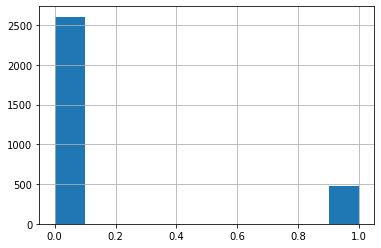

In [0]:
exp['valence'].hist()

As you can see, this is very imbalanced data. Let's use a logistic regression to start.

### (3) Encode Categorical Data

i. List All Categorical Data

In [0]:
# Categorical Features
exp.columns[exp.dtypes == 'object']

Index(['subject', 'start_survey', 'experiment', 'DATE_x', 'Period_of_day',
       'start_survey_5m_ahead', 'start_survey_10m_ahead',
       'start_survey_30m_ahead', 'start_survey_1h_ahead',
       'start_survey_3h_ahead', 'survey_date', 'subject_id_x', 'subject_id_y',
       'Date', 'Experiment', 'Subject', 'Education', 'Ethnicity', 'Sex',
       'Marital_Status', 'Household_income', 'Religion', 'Medications'],
      dtype='object')

ii. Convert Education

In [0]:
exp['Education'].unique()

MBA = ['MBA', 'High School Diploma, BA, MBA', 'B.S. Business Management', 'BS Business','College grad']
Art = ['Bachelor of Arts', 'Bachelor of Arts + Equivalency Degree', 'Bachelor Degree Music Ed']
Med = ['Medical Degree', 'B.A. English/Spanish B.S. Nursing', 'BSN- bachelors of science in nursing']
Psy = ['Education specialist in School Psy, M.A. in Educational Psy', 'M.S. Psychology/ B.A. Sociology', 'B.S. Psychology Texas A&M']


HighSchool = ['12.0','high school', 'High School', 'high school + cosmetology school', 'High School Graduate']
BA = ['Some college', 'B.A. English/Spanish B.S. Nursing', 'B.S. working on MD and MTS', 'B.S.  Mechanical Engineering', 
      "Bachelor's Degree", 'B.A.', 'College student 3 years', 'B.A. from Cornell Univ.', 'Bachelors degree in Social Work', 
      'BS', 'BA Vanderbilt', 'BS Communications', "college graduate (bachelor's degree in Music from Belmont University)",
      'Bachelor of Arts', 'BSN- bachelors of science in nursing', 'BSE Princeton',
      'Obtained B.S., 2011', 'bachelor of science', 'Bachelor of Social Work', 'B.S.', 'BBA - Bachelors', 'BSC Communications',
      'B.A. 1988', 'B.S. degree dietetics, internship', 'Bachelor of Arts + Equivalency Degree', 'Bachelors', 'B.S. Business Management',
      'B.S. Psychology Texas A&M', 'BS Journalism; BS Nutrition', 'B.E.Sc.', 'Bachelor Degree Music Ed', 'NDCDP',
      'BS Math/Computer Science', 'BS Business', 'college graduate','14.0','16.0']
Master = MBA + ['College, Masters',"Bachelor of science, 1 year of Master's",'Masters; PhD ongoing', 'M.S. Psychology/ B.A. Sociology',
                'B.S., MPH','18.0', '19.0']
PhD = ['Ph.D.', 'PhD Candidate', 'PhD', 'BS. (PhD Student currently)', 'Masters; PhD ongoing', 
       'Pursuing PhD at Vanderbilt. Have B.S. from UTK', 'BA from Stanford, JD from Univ of Michigan','21.0', '22.0', '20.0']

In [0]:
# design_matrix['is_MBA'] = 0
# design_matrix.loc[design_matrix['Education'].isin(MBA), 'is_MBA'] = 1
# design_matrix['is_Art'] = 0
# design_matrix.loc[design_matrix['Education'].isin(Art), 'is_Art'] = 1
# design_matrix['is_Med'] = 0
# design_matrix.loc[design_matrix['Education'].isin(Med), 'is_Med'] = 1
# design_matrix['is_Psy'] = 0
# design_matrix.loc[design_matrix['Education'].isin(Psy), 'is_Psy'] = 1

exp.loc[:,'edu'] = 0
exp.loc[:,'edu_hs'] = 0
exp.loc[exp['Education'].isin(HighSchool), 'edu_hs'] = 1
exp.loc[exp['Education'].isin(HighSchool), 'edu'] = 'high school'
exp.loc[:,'edu_ba'] = 0
exp.loc[exp['Education'].isin(BA), 'edu_ba'] = 1
exp.loc[exp['Education'].isin(BA), 'edu'] = 'undergrad'
exp.loc[:,'edu_ma'] = 0
exp.loc[exp['Education'].isin(Master), 'edu_ma'] = 1
exp.loc[exp['Education'].isin(Master), 'edu'] = 'master'
exp.loc[:,'edu_phd'] = 0
exp.loc[exp['Education'].isin(PhD), 'edu_phd'] = 1
exp.loc[exp['Education'].isin(PhD), 'edu'] = 'phd'

iii. Convert Ethnicity

In [0]:
design_matrix['Ethnicity'].unique()

array(['White', 'Hispanic/Other', 'Black', 'Hispanic/Caucasian',
       'Biracial', 'Hispanic', 'Asian', 'White/Pacific Islander', nan,
       'Native Hawaiian/Pacific Islander', 'More than 1 race'],
      dtype=object)

In [0]:
exp.loc[:,'is_wht'] = 0
exp.loc[exp['Ethnicity'] == 'White', 'is_wht'] = 1
exp.loc[:,'is_hsp_other'] = 0
exp.loc[exp['Ethnicity'] == 'Hispanic/Other', 'is_hsp_other'] = 1
exp.loc[:,'is_blk'] = 0
exp.loc[exp['Ethnicity'] == 'Black', 'is_blk'] = 1
exp.loc[:,'is_hsp_caucasian'] = 0
exp.loc[exp['Ethnicity'] == 'Hispanic/Caucasian', 'is_hsp_caucasian'] = 1
exp.loc[:,'is_birace'] = 0
exp.loc[exp['Ethnicity'].isin(['Biracial', 'More than 1 race']), 'is_birace'] = 1
exp.loc[:,'is_hsp'] = 0
exp.loc[exp['Ethnicity'] == 'Hispanic', 'is_hsp'] = 1
exp.loc[:,'is_asn'] = 0
exp.loc[exp['Ethnicity'] == 'Asian', 'is_asn'] = 1
exp.loc[:,'is_white_pacific'] = 0
exp.loc[exp['Ethnicity'] == 'White/Pacific Islander', 'is_white_pacific'] = 1
exp.loc[:,'is_hwi'] = 0
exp.loc[exp['Ethnicity'] == 'Native Hawaiian/Pacific Islander', 'is_hwi'] = 1

iv. Sex

In [0]:
exp['Sex'].unique()
# Drop NA in Sex column
exp = exp[~exp['Sex'].isna()]
exp.shape

(3058, 224)

In [0]:
exp['is_female'] = 0
exp.loc[exp['Sex'] == 'Female', 'is_female'] = 1

v. Marital_Status

In [0]:
exp['Marital_Status'].unique()

array(['Married', 'Divorced', 'Single', 'Engaged', 'Widowed',
       'Living with partner'], dtype=object)

In [0]:
exp.loc[:,'is_married'] = 0
exp.loc[design_matrix['Marital_Status'] == 'Married', 'is_married'] = 1
exp.loc[:,'is_divorced'] = 0
exp.loc[design_matrix['Marital_Status'] == 'Divorced', 'is_divorced'] = 1
exp.loc[:,'is_single'] = 0
exp.loc[design_matrix['Marital_Status'] == 'Single', 'is_single'] = 1
exp.loc[:,'is_widowed'] = 0
exp.loc[design_matrix['Marital_Status'] == 'Widowed', 'is_widowed'] = 1
exp.loc[:,'is_with_partner'] = 0
exp.loc[design_matrix['Marital_Status'] == 'Living with partner', 'is_with_partner'] = 1

vi. Household_income

In [0]:
exp['Household_income'].unique()
# Drop NA in Household_income column
exp = exp[~exp['Household_income'].isna()]
exp.shape

(3029, 230)

In [0]:
exp.loc[:,'income'] = 0
exp.loc[exp['Household_income'] == '$10,000-$19,999', 'income'] = 1
exp.loc[exp['Household_income'] == '$20,000-$29,999', 'income'] = 2
exp.loc[exp['Household_income'] == '$30,000-$39,999', 'income'] = 3
exp.loc[exp['Household_income'] == '$40,000-$49,999', 'income'] = 4
exp.loc[exp['Household_income'] == '$50,000-$59,999', 'income'] = 5
exp.loc[exp['Household_income'] == '$60,000-$69,999', 'income'] = 6
exp.loc[exp['Household_income'] == '$70,000-$79,999', 'income'] = 7
exp.loc[exp['Household_income'] == '$80,000-$89,999', 'income'] = 8
exp.loc[exp['Household_income'] == '$90,000-$99,999', 'income'] = 9
exp.loc[exp['Household_income'] == '$100,000-$109,999', 'income'] = 10
exp.loc[exp['Household_income'] == '$110,000-$119,999', 'income'] = 11
exp.loc[exp['Household_income'] == '$120,000-$129,999', 'income'] = 12
exp.loc[exp['Household_income'] == '$130,000-$139,000', 'income'] = 13
exp.loc[exp['Household_income'] == '$140,000-$149,999', 'income'] = 14
exp.loc[exp['Household_income'].isin(['$150,000 or more ','$150,000 or more']), 'income'] = 15

vii. Medications

In [0]:
exp['Medications'].unique()

array(['None', 'None listed', 'BP med, cholesterol med', 'Camrese',
       'Ortho-tri-sprintic (oral contraceptive)', 'Birth control (oral)',
       'Occaisonal OTC allergy and/or cold medicine',
       'Pravachol, Claritin', 'Naproxen, omeprazole',
       'Adult multivitamin, fish oil supplement, Vitamin E, Calcium+ Vitamin D supplement, Magnesium Oxide Supplement, D3 supplement, Biotin',
       'Aciphex', 'Levothyroxin, provastatin',
       'Lipitor, Diovan, 81mg Aspirin', 'Curbimide, Thyroid Med, Aspirin',
       'Vit D3, Levonogestrel/ethinyl, estradiol',
       'Lisinopril, water pill', 'Atorvastatin', 'IUD birth control',
       'Aspirin as needed', nan, 'Loloestrin', 'Mossa', 'birth control',
       'finasteride', 'Lutera (birth control)', 'lo-ogestrel (cryselle)',
       'Vitamin D supplements', 'albuterol was needed for asthma',
       'Reclipsen (Birth Control Pill)', 'Portia',
       'Mobic - antiinflammatory', 'clobetasol',
       'Spironolactone 100 mg PO Q Day',
       't

In [0]:
exp.loc[:,'have_med'] = 1
exp.loc[exp['Medications'] == 'None', 'have_med'] = 0

viii. Exp

In [0]:
# 'DND' = 0, 'ROO' = 1
exp['exp'] = 1
exp.loc[exp['experiment'] == 'DND', 'exp'] = 0

### (4) Detect Correlation

In [0]:
corr_matrix = exp[feature_num].corr()
corr_matrix_df = pd.DataFrame(corr_matrix.unstack())
corr_matrix_df.columns = ['corr']

# Filter pairs which are highly correlated
corr_matrix_df[(corr_matrix_df['corr'] > 0.9) & (corr_matrix_df['corr'] < 1)]

corr
steps_mean_3h           very_active_rate_3h      0.944557
                        running_rate_3h          0.970005
move_rate_3h            active_rate_3h           0.982064
                        very_active_rate_3h      0.928990
active_rate_3h          move_rate_3h             0.982064
                        very_active_rate_3h      0.973290
                        running_rate_3h          0.917322
very_active_rate_3h     steps_mean_3h            0.944557
                        move_rate_3h             0.928990
                        active_rate_3h           0.973290
                        running_rate_3h          0.977516
running_rate_3h         steps_mean_3h            0.970005
                        active_rate_3h           0.917322
                        very_active_rate_3h      0.977516
steps_mean_1h           very_active_rate_1h      0.927333
                        running_rate_1h          0.959266
move_rate_1h            active_rate_1h           0.972596
                        very_active_rate_1h      0.909354
active_rate_1h          move_rate_1h             0.972596
                        very_active_rate_1h      0.967026
                        running_rate_1h          0.905872
very_active_rate_1h     steps_mean_1h            0.927333
                        move_rate_1h             0.909354
                        active_rate_1h           0.967026
                        running_rate_1h          0.972520
running_rate_1h         steps_mean_1h            0.959266
                        active_rate_1h           0.905872
                        very_active_rate_1h      0.972520
steps_mean_30m          steps_median_30m         0.920333
                        very_active_rate_30m     0.923085
                        running_rate_30m         0.957074
steps_median_30m        steps_mean_30m           0.920333
move_rate_30m           active_rate_30m          0.969008
                        very_active_rate_30m     0.901710
active_rate_30m         move_rate_30m            0.969008
                        very_active_rate_30m     0.961484
very_active_rate_30m    steps_mean_30m           0.923085
                        move_rate_30m            0.901710
                        active_rate_30m          0.961484
                        running_rate_30m         0.966914
running_rate_30m        steps_mean_30m           0.957074
                        very_active_rate_30m     0.966914
steps_mean_10m          steps_median_10m         0.951602
                        very_active_rate_10m     0.909685
                        running_rate_10m         0.942009
                        steps_mean_5m            0.902805
steps_median_10m        steps_mean_10m           0.951602
move_rate_10m           active_rate_10m          0.953320
                        move_rate_5m             0.904177
active_rate_10m         move_rate_10m            0.953320
                        very_active_rate_10m     0.941897
very_active_rate_10m    steps_mean_10m           0.909685
                        active_rate_10m          0.941897
                        running_rate_10m         0.940211
running_rate_10m        steps_mean_10m           0.942009
                        very_active_rate_10m     0.940211
steps_max_5m            steps_mean_5m            0.906970
steps_mean_5m           steps_mean_10m           0.902805
                        steps_max_5m             0.906970
                        steps_median_5m          0.966001
                        running_rate_5m          0.923614
steps_median_5m         steps_mean_5m            0.966001
move_rate_5m            move_rate_10m            0.904177
                        active_rate_5m           0.939527
active_rate_5m          move_rate_5m             0.939527
                        very_active_rate_5m      0.921852
very_active_rate_5m     active_rate_5m           0.921852
                        running_rate_5m          0.916397
running_rate_5m         steps_mean_5m            0.

As we can see, the correlation exist in 'mean' and 'median' fetaures, 'var' and 'std' features. Let's get rid of them by changing feature columns.

In [0]:
# Check correlation again
corr_matrix = exp[feature_num_lite].corr()
corr_matrix_df = pd.DataFrame(corr_matrix.unstack())
corr_matrix_df.columns = ['corr']
# Filter pairs which are highly correlated
corr_matrix_df[(corr_matrix_df['corr'] > 0.9) & (corr_matrix_df['corr'] < 1)]

,,corr
hr_med,hr_0.3,0.950809
hr_0.3,hr_med,0.950809


### (5) Split the Data with one-hot encoding by Subject

In [0]:
# Construct design matrix for logistic regression. Categorical features are one-hot encoded
design_matrix_onehot = exp[feature_num_lite + subject + ['valence', 'valence_score']].dropna()
design_matrix_onehot.shape

(2133, 98)

In [0]:
# Grouped Data-Split, by subject, prevent information leakage
X_oh = design_matrix_onehot[feature_num_lite]
y_oh = design_matrix_onehot['valence_score']
y_val = design_matrix_onehot['valence']
group = design_matrix_onehot['subject'].values
gkf_modeling = list(StratifiedKFold(n_splits=4).split(X_oh,y_val,group))

X_oh_train = X_oh.iloc[gkf_modeling[1][0],]
X_oh_test = X_oh.iloc[gkf_modeling[1][1],]
y_oh_train = y_oh.iloc[gkf_modeling[1][0],]
y_oh_test = y_oh.iloc[gkf_modeling[1][1],]

# Normalization
scaler = preprocessing.StandardScaler().fit(X_oh_train)
X_oh_train_scaled = scaler.transform(X_oh_train)
X_oh_test_scaled = scaler.transform(X_oh_test)

### (6) Split the Data with categorical feature by Subject

In [0]:
# Construct design matrix for lther regression. Categorical features are not one-hot encoded
design_matrix_for_cat = exp[feature_cols_ca + subject + ['valence','valence_score']].dropna()
design_matrix_for_cat.shape

(2133, 164)

In [0]:
# Grouped Data-Split, by subject, prevent information leakage
X_cat = design_matrix_for_cat[feature_cols_ca]
y_cat = design_matrix_for_cat['valence_score']

X_cat_train = X_cat.iloc[gkf_modeling[1][0],]
X_cat_test = X_cat.iloc[gkf_modeling[1][1],]
y_cat_train = y_cat.iloc[gkf_modeling[1][0],]
y_cat_test = y_cat.iloc[gkf_modeling[1][1],]

## 4.Cross Validation with Basic Models

In [0]:
scoring = {
    # 'explained_variance': 'explained_variance',
    'r2': 'r2',
    'rmse':'neg_root_mean_squared_error'
}

In [0]:
def avg_dict(dict):
  avgDict = {}
  for k,v in dict.items():
      avgDict[k] = sum(v)/ float(len(v))
  return avgDict

In [0]:

# Information about scoring metrics
models = [LinearRegression(), Ridge(), Lasso(), svm.SVR(), BayesianRidge(), SGDRegressor(), 
          KNeighborsRegressor(n_neighbors=10), DecisionTreeRegressor(), RandomForestRegressor()]
model_names = ['Linear', 'Ridge', 'Lasso', 'svm', 'BayesianRidge', 'SGDRegressor', 'KNN', 'DecisionTreeRegressor', 'RandomForest']

for model, name in zip(models, model_names):
  print(name)
  scores = cross_validate(model, X_oh, y_oh, cv=gkf_modeling, scoring=scoring)
  print(avg_dict(scores))

Linear
{'fit_time': 0.017284393310546875, 'score_time': 0.003183901309967041, 'test_r2': -0.21604739237927867, 'test_rmse': -1.3017169347797939}
Ridge
{'fit_time': 0.008659541606903076, 'score_time': 0.002969980239868164, 'test_r2': -0.18468810417702497, 'test_rmse': -1.2842313699870473}
Lasso
{'fit_time': 0.00885385274887085, 'score_time': 0.002887725830078125, 'test_r2': -0.016146966300966847, 'test_rmse': -1.181316119010793}
svm
{'fit_time': 0.5263479948043823, 'score_time': 0.13710200786590576, 'test_r2': -0.026278369384750255, 'test_rmse': -1.1932696704057926}
BayesianRidge
{'fit_time': 0.029513895511627197, 'score_time': 0.0034832358360290527, 'test_r2': -0.02565362497647447, 'test_rmse': -1.1899840798360475}
SGDRegressor
{'fit_time': 0.04860508441925049, 'score_time': 0.009616076946258545, 'test_r2': -4.6279900738484686e+29, 'test_rmse': -662558070626494.1}
KNN
{'fit_time': 0.01833242177963257, 'score_time': 0.05706954002380371, 'test_r2': -0.11826006929444302, 'test_rmse': -1.2

Lasso, SVM, Bayesian Ridge performs the best. Let's use these three as our baseline with catboost.

## 5.Baseline Model - Lasso

### (1) Modeling

In [0]:
ls1 = Lasso(max_iter=20000)

In [0]:
ls1.fit(X_oh_train_scaled, y_oh_train)

Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=20000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

### (2) Prediction

In [0]:
def convert_reg_to_class(y_regr):
  return [0 if x >= 0 else 1 for x in y_regr]

In [0]:
ls1_regr = ls1.predict(X_oh_test_scaled)
ls1_pred = convert_reg_to_class(ls1_regr)

### (3) Evaluation

In [0]:
def eval_reg(y_test, y_pred):
  '''
  This function evaluates the regression model performance
  in terms of RMSE, R2
  
  Parameters:
  y_test (array):     Test label
  y_pred (array):     Model prediction

  Returns:
  Evaluation information printed
  array contains [RMSE, r2]
  '''
  RMSE = mean_squared_error(y_test, y_pred)
  r2 = r2_score(y_test, y_pred)
  print('RMSE: \t', str(RMSE))
  print('r2: \t', str(r2))
  return [RMSE, r2]

In [0]:
def eval_class(y_test, y_pred):
  '''
  This function evaluates the model performance
  in terms of Accuracy, Recall, Precision, Specificity and F1
  
  Parameters:
  y_test (array):     Test label
  y_pred (array):     Model prediction

  Returns:
  Evaluation information printed
  array contains [accuracy, recall, precision, specificity, npv, f1]
  '''
  # Accuracy
  accuracy = accuracy_score(y_test, y_pred)
  recall = recall_score(y_test, y_pred)
  precision = precision_score(y_test, y_pred)
  tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
  specificity = tn / (tn+fp)
  npv = tn / (tn+fn)
  f1 = f1_score(y_test, y_pred)

  print('Accuracy: \t', str(accuracy))
  print('Recall: \t', str(recall))
  print('Precision: \t', str(precision))
  print('Specificity: \t', str(specificity))
  print('NPV: \t', str(npv))
  print('F1: \t\t', str(f1))
  return [accuracy, recall, precision, specificity, npv, f1]

In [0]:
def confision_matrix(y_test, y_pred, model_type):
  '''
  This function plots confision matrix for classfication algotrithms.
  
  Parameters:
  y_test (array):     Test label
  y_pred (array):     Model prediction
  model_type (string):  Model names

  Returns: 
  Confusion Matrix plot
  '''
  cm_2 = confusion_matrix(y_test, y_pred) 
  cm_2_df = pd.DataFrame(cm_2)

  plt.figure(figsize=(5.5,4))
  sns.heatmap(cm_2_df, annot=True)
  accuracy = accuracy_score(y_test, y_pred)
  plt.title(model_type + ' Confusion Matrix \nAccuracy:{0:.3f}'.format(accuracy))
  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  plt.show()

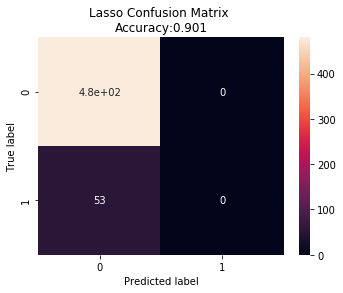

RMSE: 	 1.5535263983348966
r2: 	 -0.015127491917449332
Accuracy: 	 0.900562851782364
Recall: 	 0.0
Precision: 	 0.0
Specificity: 	 1.0
NPV: 	 0.900562851782364
F1: 		 0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[1.5535263983348966,
 -0.015127491917449332,
 0.900562851782364,
 0.0,
 0.0,
 1.0,
 0.900562851782364,
 0.0]

In [0]:
def eval(y_test, y_regr, model_type):
  y_pred = convert_reg_to_class(y_regr)
  y_test_cls = convert_reg_to_class(y_test)
  confision_matrix(y_test_cls, y_pred, model_type)
  reg_metrics = eval_reg(y_test, y_regr)
  cls_metrics = eval_class(y_test_cls, y_pred)
  return reg_metrics + cls_metrics

eval(y_oh_test, ls1_regr, 'Lasso')

All results are 1, we are suffering from imbalanced data. Let's try Random Forest.

## 6.Support Vector Machine

### (1) Modeling

In [0]:
svm1 = svm.SVR()
svm1.fit(X_oh_train_scaled, y_oh_train)

SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

###(2) Prediction

In [0]:
svm1_regr = svm1.predict(X_oh_test_scaled)

### (3) Evaluation

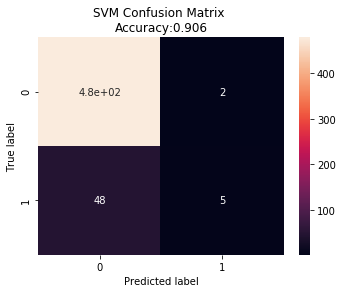

RMSE: 	 1.513775035998172
r2: 	 0.010847413171020226
Accuracy: 	 0.9061913696060038
Recall: 	 0.09433962264150944
Precision: 	 0.7142857142857143
Specificity: 	 0.9958333333333333
NPV: 	 0.908745247148289
F1: 		 0.16666666666666669


[1.513775035998172,
 0.010847413171020226,
 0.9061913696060038,
 0.09433962264150944,
 0.7142857142857143,
 0.9958333333333333,
 0.908745247148289,
 0.16666666666666669]

In [0]:
eval(y_oh_test, svm1_regr, 'SVM')

Still not perform well. Let's try to model using random split data.

## 7.Bayesian Ridge

### (1) Modeling

In [0]:
br1 = BayesianRidge()
br1.fit(X_oh_train_scaled, y_oh_train)

BayesianRidge(alpha_1=1e-06, alpha_2=1e-06, alpha_init=None,
              compute_score=False, copy_X=True, fit_intercept=True,
              lambda_1=1e-06, lambda_2=1e-06, lambda_init=None, n_iter=300,
              normalize=False, tol=0.001, verbose=False)

### (2) Prediction

In [0]:
br1_regr = br1.predict(X_oh_test_scaled)

### (3) Evaluation

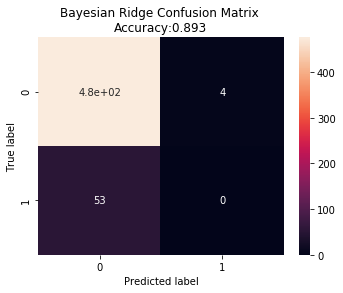

RMSE: 	 1.536283937507127
r2: 	 -0.003860675960321691
Accuracy: 	 0.8930581613508443
Recall: 	 0.0
Precision: 	 0.0
Specificity: 	 0.9916666666666667
NPV: 	 0.8998109640831758
F1: 		 0.0


[1.536283937507127,
 -0.003860675960321691,
 0.8930581613508443,
 0.0,
 0.0,
 0.9916666666666667,
 0.8998109640831758,
 0.0]

In [0]:
eval(y_oh_test, br1_regr, 'Bayesian Ridge')

## 8.CatBoost

### (1) Modeling

In [0]:
categorical_features_indices = np.where(X_cat_train.dtypes != np.float)[0]

In [0]:
# Model params
params_1 = {
    'iterations': 10000,
    'loss_function': 'RMSE',
    'eval_metric': 'RMSE',
    'verbose': 10,
    'random_seed': 24,
    # 'depth':6, 
    'learning_rate':0.01,
    'use_best_model': True,
    'l2_leaf_reg': 10,
    'bagging_temperature': 3,
    'od_type': "Iter",
    'od_wait': 100
}

cat1 = catboost.CatBoostRegressor(**params_1)
cat1.fit(X_cat_train, y_cat_train,
             eval_set = (X_cat_test, y_cat_test),
             use_best_model = True,
             cat_features = categorical_features_indices,
             plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 1.1658386	test: 1.2447218	best: 1.2447218 (0)	total: 164ms	remaining: 27m 17s
10:	learn: 1.1500172	test: 1.2336391	best: 1.2336391 (10)	total: 584ms	remaining: 8m 50s
20:	learn: 1.1355483	test: 1.2233780	best: 1.2233780 (20)	total: 898ms	remaining: 7m 6s
30:	learn: 1.1220514	test: 1.2126472	best: 1.2126472 (30)	total: 1.21s	remaining: 6m 28s
40:	learn: 1.1098075	test: 1.2042716	best: 1.2042716 (40)	total: 1.52s	remaining: 6m 8s
50:	learn: 1.0992605	test: 1.1992529	best: 1.1992529 (50)	total: 1.83s	remaining: 5m 56s
60:	learn: 1.0889336	test: 1.1921674	best: 1.1921674 (60)	total: 2.14s	remaining: 5m 49s
70:	learn: 1.0785997	test: 1.1854789	best: 1.1854789 (70)	total: 2.45s	remaining: 5m 42s
80:	learn: 1.0683352	test: 1.1791701	best: 1.1791701 (80)	total: 2.75s	remaining: 5m 36s
90:	learn: 1.0597375	test: 1.1763442	best: 1.1763361 (89)	total: 3.07s	remaining: 5m 34s
100:	learn: 1.0518365	test: 1.1721263	best: 1.1721263 (100)	total: 3.38s	remaining: 5m 30s
110:	learn: 1.0445145	

### (2) Prediction

In [0]:
cat1_regr = cat1.predict(X_cat_test)

### (3) Evaluation

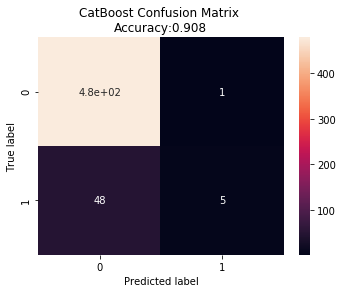

RMSE: 	 1.2669255374219017
r2: 	 0.17214735158171635
Accuracy: 	 0.9080675422138836
Recall: 	 0.09433962264150944
Precision: 	 0.8333333333333334
Specificity: 	 0.9979166666666667
NPV: 	 0.9089184060721063
F1: 		 0.16949152542372883


[1.2669255374219017,
 0.17214735158171635,
 0.9080675422138836,
 0.09433962264150944,
 0.8333333333333334,
 0.9979166666666667,
 0.9089184060721063,
 0.16949152542372883]

In [0]:
eval(y_cat_test, cat1_regr, 'CatBoost')

In [0]:
def catboost_feature_importance(model, feature_col):
  # Extract feature importance
  feature_importance = pd.Series(model.feature_importances_)
  feature_name = pd.Series(feature_col)
  feature_importance_score = pd.DataFrame(dict(feature_name = feature_name, score = feature_importance))
  # Sort by score
  return feature_importance_score.sort_values(by='score', ascending=False)
  # print(feature_importance_score.head(20))

In [0]:
cat1_feature_score = catboost_feature_importance(cat1, X_cat_test.columns.values)
cat1_feature_score.head(20)

,feature_name,score
140,LAP_actual,10.349454
143,N_actual,7.902960
156,Ethnicity,4.771719
158,Marital_Status,4.768454
138,HAP_actual,3.847054
129,Neuroticism,3.822928
139,P_actual,2.891792
128,SWLS,2.771122
144,HAN_actual,2.642452
48,hr_max,2.593726


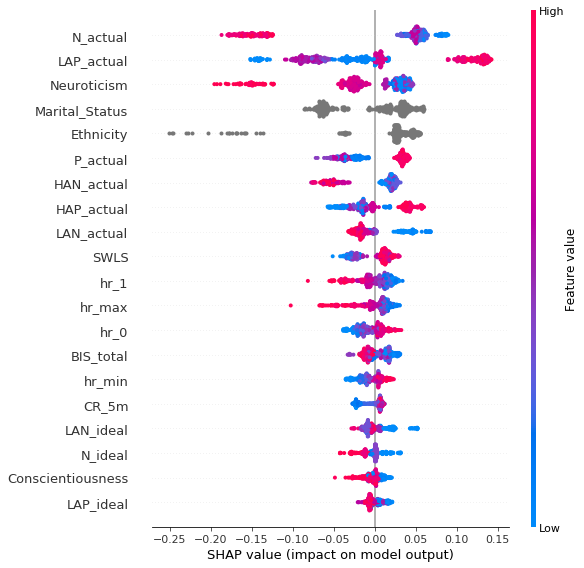

In [0]:
# start_time = time.time()
shap_values = cat1.get_feature_importance(catboost.Pool(X_cat_test, label=y_cat_test, cat_features=categorical_features_indices), type="ShapValues")
expected_value = shap_values[0,-1]
shap_values = shap_values[:,:-1]

shap.summary_plot(shap_values, X_cat_test) 
# elapsed = time.time() - start_time

In [0]:
shap_values.shape

(533, 161)

In [0]:
shap.initjs()
shap.force_plot(expected_value, shap_values[2,:], X_cat_test.iloc[2,:])

In [0]:
def log_loss(m, X, y): 
    return metrics.log_loss(y,m.predict_proba(X)[:,1])

def mse(model, y_test, X_test):
    y_pred = model.predict(X_test)
    return mean_squared_error(y_test, y_pred)

def permutation_importances(model, X, y, metric):
    baseline = metric(model, X, y)
    imp = []
    for col in X.columns:
        save = X[col].copy()
        X[col] = np.random.permutation(X[col])
        m = metric(model, X, y)
        X[col] = save
        imp.append(m-baseline)
    return np.array(imp)

def baseline_importance(model, X, y, X_test, y_test, metric):
    
    model = CatBoostClassifier(one_hot_max_size = 10, iterations = 500)
    model.fit(X, y, cat_features = categorical_features_indices, verbose = False)
    baseline = metric(model, X_test, y_test)
    
    imp = []
    for col in X.columns:
        
        save = X[col].copy()
        X[col] = np.random.permutation(X[col])
        
        model.fit(X, y, cat_features = categorical_features_indices, verbose = False)
        m = metric(model, X_test, y_test)
        X[col] = save
        imp.append(m-baseline)
    return np.array(imp)

def get_feature_imp_plot(model, method, X_train, y_train, X_test, y_test):
    
    if method == "Permutation":
        fi =  permutation_importances(model, X_test, y_test, mse)
    
    elif method == "Baseline":
        fi = baseline_importance(model, X_train, y_train, X_test, y_test, mse)
    
    elif method == "ShapValues":
        shap_values = model.get_feature_importance(Pool(X_test, label=y_test,cat_features=categorical_features_indices), 
                                                                     type="ShapValues")
        shap_values = shap_values[:,:-1]
        shap.summary_plot(shap_values, X_test) 
        
    else:
        fi = model.get_feature_importance(Pool(X_test, label=y_test, cat_features=categorical_features_indices), 
                                                                     type=method)
        
    if method != "ShapValues":
        feature_score = pd.DataFrame(list(zip(X_test.dtypes.index, fi )),
                                        columns=['Feature','Score'])

        feature_score = feature_score.sort_values(by='Score', ascending=False, inplace=False, kind='quicksort', na_position='last')

        plt.rcParams["figure.figsize"] = (60,7)
        ax = feature_score.plot('Feature', 'Score', kind='bar', color='c')
        ax.set_title("Feature Importance using {}".format(method), fontsize = 14)
        ax.set_xlabel("features")
        plt.show()

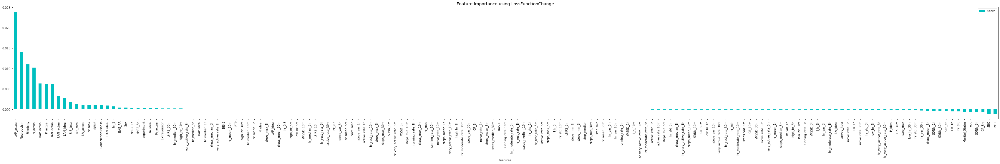

In [0]:
from catboost import Pool
get_feature_imp_plot(cat1, "LossFunctionChange", X_cat_train, y_cat_train, X_cat_test, y_cat_test)

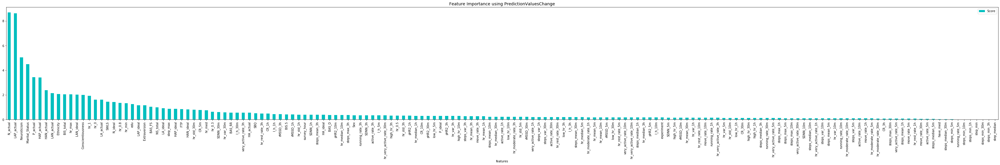

In [0]:
get_feature_imp_plot(cat1, "PredictionValuesChange", X_cat_train, y_cat_train, X_cat_test, y_cat_test)

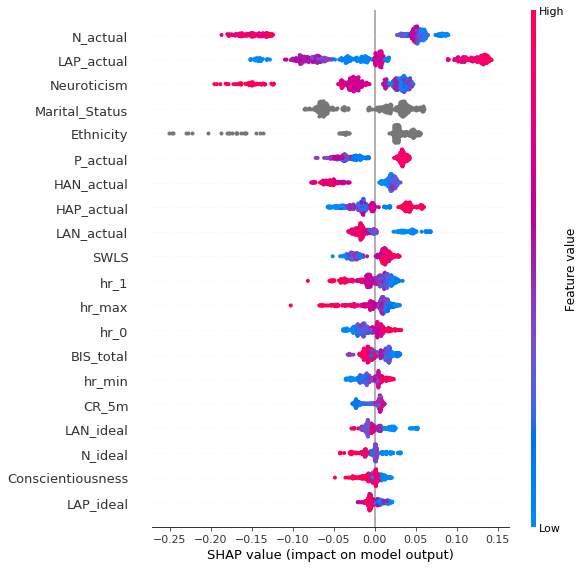

In [0]:
get_feature_imp_plot(cat1, "ShapValues", X_cat_train, y_cat_train, X_cat_test, y_cat_test)

CatBoost is still suffer from imbalanced data. Let's use sampling technology to remedy imbalanced data.

## 9.Over Sample Minority Class

### (1) Upsample for Data with categorical feature

In [0]:
def upsample_data_with_cat(X_train, y_train):
  # concatenate our training data back together
  data_cat_to_sample = pd.concat([X_train, y_train], axis=1)

  # separate minority and majority classes
  unhappy_cat = data_cat_to_sample[data_cat_to_sample['valence_score'] < 0]
  happy_cat = data_cat_to_sample[data_cat_to_sample['valence_score'] >= 0]


  # upsample minority
  unhappy_cat_upsampled = resample(unhappy_cat,
                            replace=True, # sample with replacement
                            n_samples=len(happy_cat), # match number in majority class
                            random_state=27) # reproducible results

  # combine majority and upsampled minority
  upsampled_cat = pd.concat([happy_cat, unhappy_cat_upsampled])

  # check new class counts
  print(upsampled_cat[upsampled_cat['valence_score']>=0].shape)
  print(upsampled_cat[upsampled_cat['valence_score']<0].shape)

  # Split train and test
  y_upsample_train = upsampled_cat['valence_score']
  X_upsample_train = upsampled_cat.drop('valence_score', axis=1)

  return X_upsample_train, y_upsample_train

X_cat_upsample_train, y_cat_upsample_train = upsample_data_with_cat(X_cat_train, y_cat_train)

(1419, 162)
(1419, 162)


### (2) Upsample Data for design matrix with one-hot encoding

In [0]:
def upsample_data_with_oh(X_train, y_train, X_test):
  # concatenate our training data back together
  data_to_sample = pd.concat([X_train, y_train], axis=1)

  # separate minority and majority classes
  unhappy = data_to_sample[data_to_sample['valence_score'] < 0]
  happy = data_to_sample[data_to_sample['valence_score'] >= 0]

  # upsample minority
  unhappy_upsampled = resample(unhappy,
                            replace=True, # sample with replacement
                            n_samples=len(happy), # match number in majority class
                            random_state=27) # reproducible results

  # combine majority and upsampled minority
  upsampled = pd.concat([happy, unhappy_upsampled])

  # check new class counts
  print(upsampled[upsampled['valence_score']>=0].shape)
  print(upsampled[upsampled['valence_score']<0].shape)

  # Split train and test
  y_upsample_train = upsampled['valence_score']
  X_upsample_train = upsampled.drop('valence_score', axis=1)

  # Scale for logistic regression
  scaler = preprocessing.StandardScaler().fit(X_upsample_train)
  X_upsample_train_scaled = scaler.transform(X_upsample_train)
  X_test_scaled = scaler.transform(X_test)

  return X_upsample_train_scaled, y_upsample_train, X_test_scaled

X_oh_upsample_train_scaled, y_oh_upsample_train, X_oh_test_scaled = upsample_data_with_oh(X_oh_train, y_oh_train, X_oh_test)

(1419, 96)
(1419, 96)


### (3) Lasso Regression

i. Modeling

In [0]:
ls2 = Lasso(max_iter=20000, alpha=0.001)
ls2.fit(X_oh_upsample_train_scaled, y_oh_upsample_train)

Lasso(alpha=0.001, copy_X=True, fit_intercept=True, max_iter=20000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

ii. Prediction

In [0]:
ls2_regr = ls2.predict(X_oh_test_scaled)

iiii. Evaluation

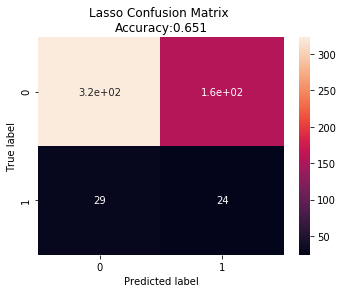

RMSE: 	 3.123734520156758
r2: 	 -1.041155394759575
Accuracy: 	 0.651031894934334
Recall: 	 0.4528301886792453
Precision: 	 0.13259668508287292
Specificity: 	 0.6729166666666667
NPV: 	 0.9176136363636364
F1: 		 0.20512820512820512


[3.123734520156758,
 -1.041155394759575,
 0.651031894934334,
 0.4528301886792453,
 0.13259668508287292,
 0.6729166666666667,
 0.9176136363636364,
 0.20512820512820512]

In [0]:
eval(y_oh_test, ls2_regr, 'Lasso')

In [0]:
ls_index = ls2.coef_ > 0
X_oh_train.columns.values[ls_index]

array(['steps_min_1h', 'steps_var_1h', 'steps_median_1h',
       'active_rate_1h', 'steps_var_10m', 'steps_median_10m',
       'move_rate_10m', 'hr_min', 'hr_med', 'pHR2_3h', 'low_hr_3h',
       'SDNN_1h', 'pHR2_1h', 'high_hr_1h', 'l_h_1h', 'hr_mean_1h',
       'hr_rest_rate_1h', 'hr_moderate_rate_1h', 'pHR2_30m',
       'high_hr_30m', 'l_h_30m', 'CR_30m', 'SDNN_10m', 'hr_std_10m',
       'hr_very_active_rate_10m', 'rMSSD_5m', 'low_hr_5m', 'high_hr_5m',
       'hr_0.8', 'SWLS', 'NS_total', 'BAS_FS', 'Age', 'Children',
       'income', 'is_married', 'is_divorced', 'is_single', 'is_widowed',
       'is_blk', 'is_hsp_caucasian', 'is_birace', 'edu_ba', 'edu_ma',
       'edu_phd'], dtype=object)

### (4) SVM

i. Modeling

In [0]:
svm2 = svm.SVR()
svm2.fit(X_oh_upsample_train_scaled, y_oh_upsample_train)

SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

ii.Prediction

In [0]:
svm2_regr = svm2.predict(X_oh_test)

iii.Evaluation

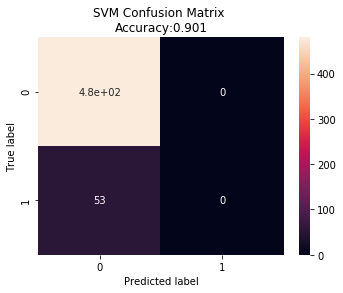

RMSE: 	 1.701680042579718
r2: 	 -0.1119361702005297
Accuracy: 	 0.900562851782364
Recall: 	 0.0
Precision: 	 0.0
Specificity: 	 1.0
NPV: 	 0.900562851782364
F1: 		 0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[1.701680042579718,
 -0.1119361702005297,
 0.900562851782364,
 0.0,
 0.0,
 1.0,
 0.900562851782364,
 0.0]

In [0]:
eval(y_oh_test, svm2_regr, 'SVM')

###(5) Bayesian Rdige

i. Modeling

In [0]:
br2 = BayesianRidge()
br2.fit(X_oh_upsample_train_scaled, y_oh_upsample_train)

BayesianRidge(alpha_1=1e-06, alpha_2=1e-06, alpha_init=None,
              compute_score=False, copy_X=True, fit_intercept=True,
              lambda_1=1e-06, lambda_2=1e-06, lambda_init=None, n_iter=300,
              normalize=False, tol=0.001, verbose=False)

ii. Prediction

In [0]:
br2_regr = br2.predict(X_oh_test)

iii. Evaluation

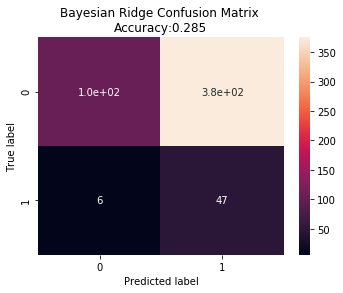

RMSE: 	 11262.002647758356
r2: 	 -7357.979232049147
Accuracy: 	 0.2851782363977486
Recall: 	 0.8867924528301887
Precision: 	 0.11137440758293839
Specificity: 	 0.21875
NPV: 	 0.9459459459459459
F1: 		 0.19789473684210526


[11262.002647758356,
 -7357.979232049147,
 0.2851782363977486,
 0.8867924528301887,
 0.11137440758293839,
 0.21875,
 0.9459459459459459,
 0.19789473684210526]

In [0]:
eval(y_oh_test, br2_regr, 'Bayesian Ridge')

### (6) Random Forest

i. Modeling

In [0]:
rf2 = RandomForestRegressor()
rf2.fit(X_oh_upsample_train_scaled, y_oh_upsample_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

ii. Prediction

In [0]:
rf2_regr = rf2.predict(X_oh_test)

iii. Evaluation

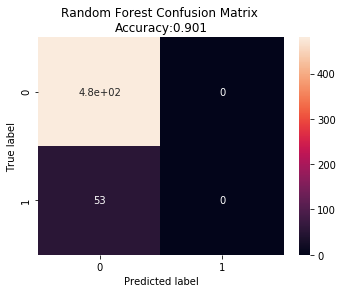

RMSE: 	 1.556291452991453
r2: 	 -0.01693427357338595
Accuracy: 	 0.900562851782364
Recall: 	 0.0
Precision: 	 0.0
Specificity: 	 1.0
NPV: 	 0.900562851782364
F1: 		 0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[1.556291452991453,
 -0.01693427357338595,
 0.900562851782364,
 0.0,
 0.0,
 1.0,
 0.900562851782364,
 0.0]

In [0]:
eval(y_oh_test, rf2_regr, 'Random Forest')

### (7) CatBoost

i. Modeling

In [0]:
# Model params
params_2 = {
    'iterations': 10000,
    'loss_function': 'RMSE',
    'eval_metric': 'RMSE',
    'verbose': 10,
    'random_seed': 24,
    # 'depth':6, 
    'learning_rate':0.01,
    'use_best_model': True,
    'l2_leaf_reg': 10,
    'bagging_temperature': 3,
    'od_type': "Iter",
    'od_wait': 100
}
categorical_features_indices = np.where(X_cat_upsample_train.dtypes != np.float)[0]
cat2 = catboost.CatBoostRegressor(**params_2)
cat2.fit(X_cat_upsample_train, y_cat_upsample_train,
             eval_set = (X_cat_test, y_cat_test),
             cat_features = categorical_features_indices,
             use_best_model = True,
             plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 1.4724915	test: 1.6654366	best: 1.6654366 (0)	total: 52.9ms	remaining: 8m 48s
10:	learn: 1.4360379	test: 1.6372653	best: 1.6372653 (10)	total: 523ms	remaining: 7m 54s
20:	learn: 1.4028034	test: 1.6139603	best: 1.6139603 (20)	total: 858ms	remaining: 6m 47s
30:	learn: 1.3722137	test: 1.5884694	best: 1.5884694 (30)	total: 1.19s	remaining: 6m 22s
40:	learn: 1.3444820	test: 1.5685885	best: 1.5685885 (40)	total: 1.52s	remaining: 6m 9s
50:	learn: 1.3187157	test: 1.5509664	best: 1.5509664 (50)	total: 1.85s	remaining: 6m 1s
60:	learn: 1.2928168	test: 1.5350542	best: 1.5350542 (60)	total: 2.22s	remaining: 6m 1s
70:	learn: 1.2701611	test: 1.5207564	best: 1.5207564 (70)	total: 2.56s	remaining: 5m 57s
80:	learn: 1.2487569	test: 1.5052201	best: 1.5052201 (80)	total: 2.9s	remaining: 5m 54s
90:	learn: 1.2302504	test: 1.4939880	best: 1.4939880 (90)	total: 3.25s	remaining: 5m 54s
100:	learn: 1.2126604	test: 1.4824592	best: 1.4824592 (100)	total: 3.6s	remaining: 5m 52s
110:	learn: 1.1966071	tes

ii. Prediction

In [0]:
cat2_regr = cat2.predict(X_cat_test)

iii. Evaluation

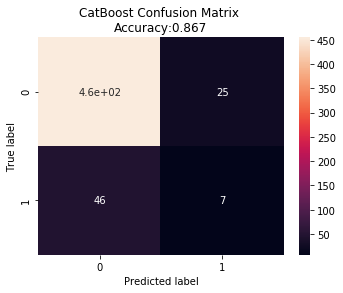

RMSE: 	 1.4580235443770362
r2: 	 0.04727735212840134
Accuracy: 	 0.8667917448405253
Recall: 	 0.1320754716981132
Precision: 	 0.21875
Specificity: 	 0.9479166666666666
NPV: 	 0.908183632734531
F1: 		 0.1647058823529412


[1.4580235443770362,
 0.04727735212840134,
 0.8667917448405253,
 0.1320754716981132,
 0.21875,
 0.9479166666666666,
 0.908183632734531,
 0.1647058823529412]

In [0]:
eval(y_cat_test, cat2_regr, 'CatBoost')

In [0]:
cat2_feature_score = catboost_feature_importance(cat2, X_cat_test.columns.values)
cat2_feature_score.head(20)

,feature_name,score
140,LAP_actual,7.291584
143,N_actual,4.504666
158,Marital_Status,4.480963
142,LAN_actual,3.021389
132,NS_total,2.832823
129,Neuroticism,2.608721
144,HAN_actual,2.089805
128,SWLS,1.943238
138,HAP_actual,1.888872
0,step_max,1.625440


### (8) Cross Validation

i. Cross validate

In [0]:
def model_eval(model, model_name, sample_type):
  if sample_type == 'up':
    X_cat_train = X_cat_upsample_train
    y_cat_train = y_cat_upsample_train
    X_oh_train = X_oh_upsample_train_scaled
    y_oh_train = y_oh_upsample_train
  elif sample_type == 'down':
    X_cat_train = X_cat_downsample_train
    y_cat_train = y_cat_downsample_train
    X_oh_train = X_oh_downsample_train_scaled
    y_oh_train = y_oh_downsample_train

  if model_name == 'CatBoost':
    cat = catboost.CatBoostRegressor(**params_2)
    cat.fit(X_cat_train, y_cat_train,
              eval_set = (X_cat_test, y_cat_test),
              cat_features = categorical_features_indices,
              use_best_model = True,
              plot=True)
    m_regr = cat.predict(X_cat_test)
    return eval(y_cat_test, m_regr, model_name)
  else:
    model.fit(X_oh_train, y_oh_train)
    m_regr = model.predict(X_oh_test_scaled)
    return eval(y_oh_test, m_regr, model_name)

(1414, 96)
(1414, 96)
(1419, 162)
(1419, 162)


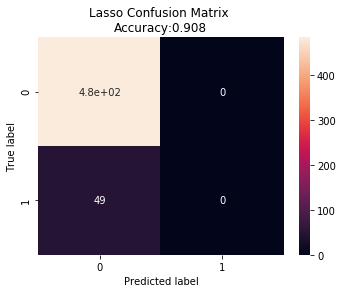

RMSE: 	 2.207431237450523
r2: 	 -0.8952704079610387
Accuracy: 	 0.9082397003745318
Recall: 	 0.0
Precision: 	 0.0
Specificity: 	 1.0
NPV: 	 0.9082397003745318
F1: 		 0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


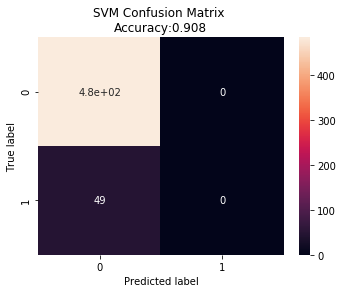

RMSE: 	 1.275483497649067
r2: 	 -0.09511276633417776
Accuracy: 	 0.9082397003745318
Recall: 	 0.0
Precision: 	 0.0
Specificity: 	 1.0
NPV: 	 0.9082397003745318
F1: 		 0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


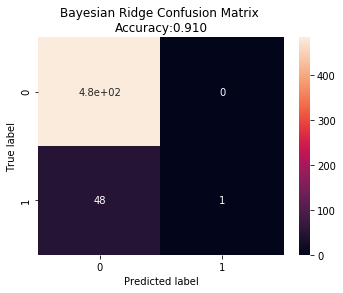

RMSE: 	 1.6546439583987904
r2: 	 -0.4206547759497461
Accuracy: 	 0.9101123595505618
Recall: 	 0.02040816326530612
Precision: 	 1.0
Specificity: 	 1.0
NPV: 	 0.9099437148217636
F1: 		 0.039999999999999994


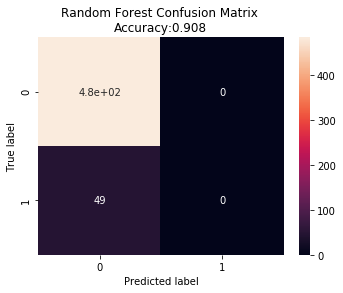

RMSE: 	 1.6083403454015812
r2: 	 -0.38089912421916394
Accuracy: 	 0.9082397003745318
Recall: 	 0.0
Precision: 	 0.0
Specificity: 	 1.0
NPV: 	 0.9082397003745318
F1: 		 0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 1.4724915	test: 1.6654366	best: 1.6654366 (0)	total: 82.1ms	remaining: 13m 41s
10:	learn: 1.4360379	test: 1.6372653	best: 1.6372653 (10)	total: 457ms	remaining: 6m 54s
20:	learn: 1.4028034	test: 1.6139603	best: 1.6139603 (20)	total: 779ms	remaining: 6m 10s
30:	learn: 1.3722137	test: 1.5884694	best: 1.5884694 (30)	total: 1.1s	remaining: 5m 55s
40:	learn: 1.3444820	test: 1.5685885	best: 1.5685885 (40)	total: 1.43s	remaining: 5m 48s
50:	learn: 1.3187157	test: 1.5509664	best: 1.5509664 (50)	total: 1.76s	remaining: 5m 44s
60:	learn: 1.2928168	test: 1.5350542	best: 1.5350542 (60)	total: 2.1s	remaining: 5m 42s
70:	learn: 1.2701611	test: 1.5207564	best: 1.5207564 (70)	total: 2.41s	remaining: 5m 37s
80:	learn: 1.2487569	test: 1.5052201	best: 1.5052201 (80)	total: 2.72s	remaining: 5m 33s
90:	learn: 1.2302504	test: 1.4939880	best: 1.4939880 (90)	total: 3.06s	remaining: 5m 32s
100:	learn: 1.2126604	test: 1.4824592	best: 1.4824592 (100)	total: 3.42s	remaining: 5m 35s
110:	learn: 1.1966071

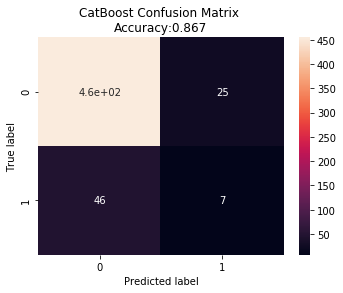

RMSE: 	 1.4580235443770362
r2: 	 0.04727735212840134
Accuracy: 	 0.8667917448405253
Recall: 	 0.1320754716981132
Precision: 	 0.21875
Specificity: 	 0.9479166666666666
NPV: 	 0.908183632734531
F1: 		 0.1647058823529412
(1419, 96)
(1419, 96)
(1419, 162)
(1419, 162)


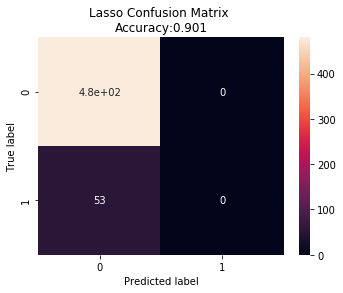

RMSE: 	 2.786550604342287
r2: 	 -0.8208278463236318
Accuracy: 	 0.900562851782364
Recall: 	 0.0
Precision: 	 0.0
Specificity: 	 1.0
NPV: 	 0.900562851782364
F1: 		 0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


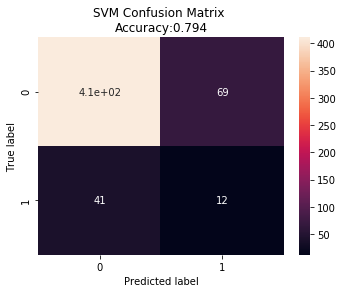

RMSE: 	 2.175349652607854
r2: 	 -0.4214481577282265
Accuracy: 	 0.7936210131332082
Recall: 	 0.22641509433962265
Precision: 	 0.14814814814814814
Specificity: 	 0.85625
NPV: 	 0.9092920353982301
F1: 		 0.17910447761194032


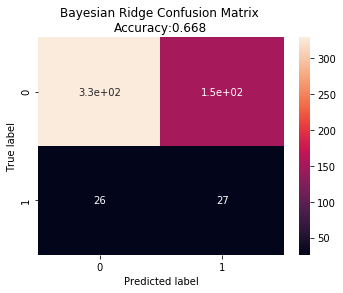

RMSE: 	 2.9827110023387795
r2: 	 -0.9490057859100705
Accuracy: 	 0.6679174484052532
Recall: 	 0.5094339622641509
Precision: 	 0.15168539325842698
Specificity: 	 0.6854166666666667
NPV: 	 0.9267605633802817
F1: 		 0.23376623376623376


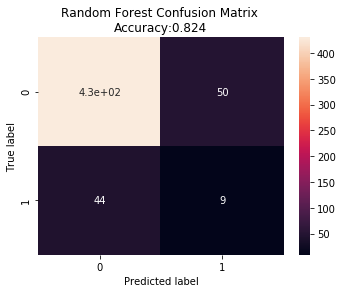

RMSE: 	 2.098915551386283
r2: 	 -0.3715034914816917
Accuracy: 	 0.8236397748592871
Recall: 	 0.16981132075471697
Precision: 	 0.15254237288135594
Specificity: 	 0.8958333333333334
NPV: 	 0.9071729957805907
F1: 		 0.16071428571428573


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 1.4724915	test: 1.6654366	best: 1.6654366 (0)	total: 80.6ms	remaining: 13m 25s
10:	learn: 1.4360379	test: 1.6372653	best: 1.6372653 (10)	total: 476ms	remaining: 7m 12s
20:	learn: 1.4028034	test: 1.6139603	best: 1.6139603 (20)	total: 806ms	remaining: 6m 23s
30:	learn: 1.3722137	test: 1.5884694	best: 1.5884694 (30)	total: 1.14s	remaining: 6m 6s
40:	learn: 1.3444820	test: 1.5685885	best: 1.5685885 (40)	total: 1.47s	remaining: 5m 56s
50:	learn: 1.3187157	test: 1.5509664	best: 1.5509664 (50)	total: 1.8s	remaining: 5m 51s
60:	learn: 1.2928168	test: 1.5350542	best: 1.5350542 (60)	total: 2.15s	remaining: 5m 49s
70:	learn: 1.2701611	test: 1.5207564	best: 1.5207564 (70)	total: 2.48s	remaining: 5m 46s
80:	learn: 1.2487569	test: 1.5052201	best: 1.5052201 (80)	total: 2.81s	remaining: 5m 43s
90:	learn: 1.2302504	test: 1.4939880	best: 1.4939880 (90)	total: 3.14s	remaining: 5m 42s
100:	learn: 1.2126604	test: 1.4824592	best: 1.4824592 (100)	total: 3.48s	remaining: 5m 41s
110:	learn: 1.1966071

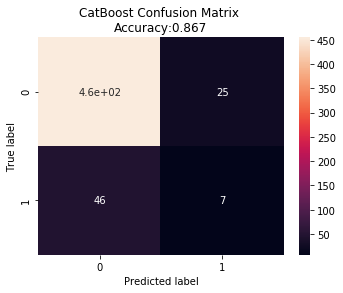

RMSE: 	 1.4580235443770362
r2: 	 0.04727735212840134
Accuracy: 	 0.8667917448405253
Recall: 	 0.1320754716981132
Precision: 	 0.21875
Specificity: 	 0.9479166666666666
NPV: 	 0.908183632734531
F1: 		 0.1647058823529412
(1435, 96)
(1435, 96)
(1419, 162)
(1419, 162)


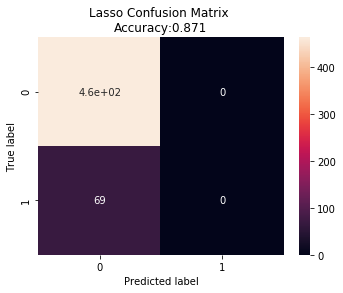

RMSE: 	 2.0901286435347792
r2: 	 -0.503965327438638
Accuracy: 	 0.8705440900562852
Recall: 	 0.0
Precision: 	 0.0
Specificity: 	 1.0
NPV: 	 0.8705440900562852
F1: 		 0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


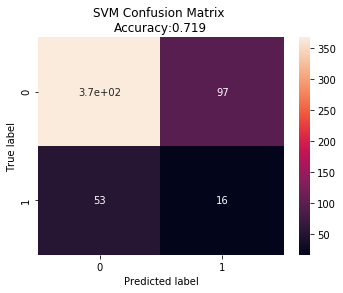

RMSE: 	 2.1884776460569637
r2: 	 -0.5747329762333995
Accuracy: 	 0.7185741088180112
Recall: 	 0.2318840579710145
Precision: 	 0.1415929203539823
Specificity: 	 0.790948275862069
NPV: 	 0.8738095238095238
F1: 		 0.1758241758241758


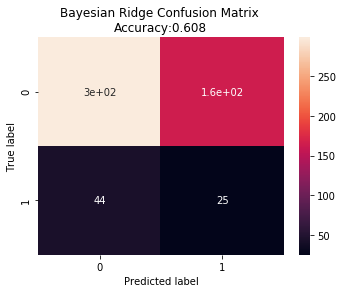

RMSE: 	 3.344045690903339
r2: 	 -1.4062292950465083
Accuracy: 	 0.6078799249530957
Recall: 	 0.36231884057971014
Precision: 	 0.13157894736842105
Specificity: 	 0.6443965517241379
NPV: 	 0.8717201166180758
F1: 		 0.19305019305019305


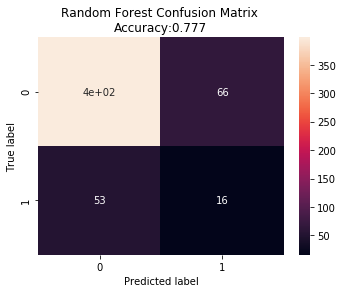

RMSE: 	 2.018577485928706
r2: 	 -0.45248023798708936
Accuracy: 	 0.776735459662289
Recall: 	 0.2318840579710145
Precision: 	 0.1951219512195122
Specificity: 	 0.8577586206896551
NPV: 	 0.8824833702882483
F1: 		 0.21192052980132453


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 1.4724915	test: 1.6654366	best: 1.6654366 (0)	total: 71.3ms	remaining: 11m 52s
10:	learn: 1.4360379	test: 1.6372653	best: 1.6372653 (10)	total: 497ms	remaining: 7m 31s
20:	learn: 1.4028034	test: 1.6139603	best: 1.6139603 (20)	total: 831ms	remaining: 6m 34s
30:	learn: 1.3722137	test: 1.5884694	best: 1.5884694 (30)	total: 1.16s	remaining: 6m 12s
40:	learn: 1.3444820	test: 1.5685885	best: 1.5685885 (40)	total: 1.48s	remaining: 6m
50:	learn: 1.3187157	test: 1.5509664	best: 1.5509664 (50)	total: 1.8s	remaining: 5m 51s
60:	learn: 1.2928168	test: 1.5350542	best: 1.5350542 (60)	total: 2.14s	remaining: 5m 49s
70:	learn: 1.2701611	test: 1.5207564	best: 1.5207564 (70)	total: 2.48s	remaining: 5m 46s
80:	learn: 1.2487569	test: 1.5052201	best: 1.5052201 (80)	total: 2.8s	remaining: 5m 43s
90:	learn: 1.2302504	test: 1.4939880	best: 1.4939880 (90)	total: 3.15s	remaining: 5m 42s
100:	learn: 1.2126604	test: 1.4824592	best: 1.4824592 (100)	total: 3.48s	remaining: 5m 40s
110:	learn: 1.1966071	tes

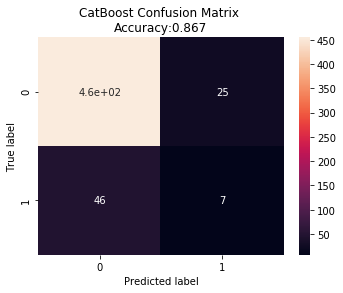

RMSE: 	 1.4580235443770362
r2: 	 0.04727735212840134
Accuracy: 	 0.8667917448405253
Recall: 	 0.1320754716981132
Precision: 	 0.21875
Specificity: 	 0.9479166666666666
NPV: 	 0.908183632734531
F1: 		 0.1647058823529412
(1429, 96)
(1429, 96)
(1419, 162)
(1419, 162)


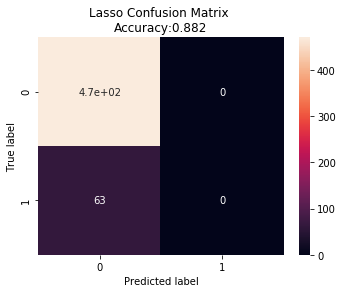

RMSE: 	 2.738141321576607
r2: 	 -0.8118497816862651
Accuracy: 	 0.8818011257035647
Recall: 	 0.0
Precision: 	 0.0
Specificity: 	 1.0
NPV: 	 0.8818011257035647
F1: 		 0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


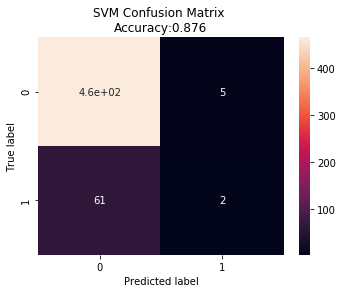

RMSE: 	 1.722061544903415
r2: 	 -0.1395017523737665
Accuracy: 	 0.8761726078799249
Recall: 	 0.031746031746031744
Precision: 	 0.2857142857142857
Specificity: 	 0.9893617021276596
NPV: 	 0.8840304182509505
F1: 		 0.057142857142857134


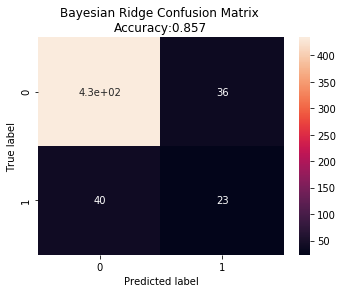

RMSE: 	 2.731311604541041
r2: 	 -0.8073305038745762
Accuracy: 	 0.8574108818011257
Recall: 	 0.36507936507936506
Precision: 	 0.3898305084745763
Specificity: 	 0.9234042553191489
NPV: 	 0.9156118143459916
F1: 		 0.3770491803278688


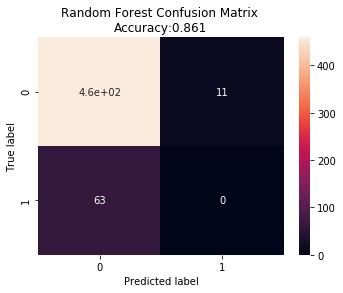

RMSE: 	 1.613377131540546
r2: 	 -0.06758441594102593
Accuracy: 	 0.8611632270168855
Recall: 	 0.0
Precision: 	 0.0
Specificity: 	 0.9765957446808511
NPV: 	 0.8793103448275862
F1: 		 0.0


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 1.4724915	test: 1.6654366	best: 1.6654366 (0)	total: 101ms	remaining: 16m 52s
10:	learn: 1.4360379	test: 1.6372653	best: 1.6372653 (10)	total: 426ms	remaining: 6m 27s
20:	learn: 1.4028034	test: 1.6139603	best: 1.6139603 (20)	total: 764ms	remaining: 6m 3s
30:	learn: 1.3722137	test: 1.5884694	best: 1.5884694 (30)	total: 1.1s	remaining: 5m 52s
40:	learn: 1.3444820	test: 1.5685885	best: 1.5685885 (40)	total: 1.43s	remaining: 5m 47s
50:	learn: 1.3187157	test: 1.5509664	best: 1.5509664 (50)	total: 1.76s	remaining: 5m 42s
60:	learn: 1.2928168	test: 1.5350542	best: 1.5350542 (60)	total: 2.11s	remaining: 5m 43s
70:	learn: 1.2701611	test: 1.5207564	best: 1.5207564 (70)	total: 2.44s	remaining: 5m 41s
80:	learn: 1.2487569	test: 1.5052201	best: 1.5052201 (80)	total: 2.77s	remaining: 5m 39s
90:	learn: 1.2302504	test: 1.4939880	best: 1.4939880 (90)	total: 3.12s	remaining: 5m 40s
100:	learn: 1.2126604	test: 1.4824592	best: 1.4824592 (100)	total: 3.46s	remaining: 5m 38s
110:	learn: 1.1966071	

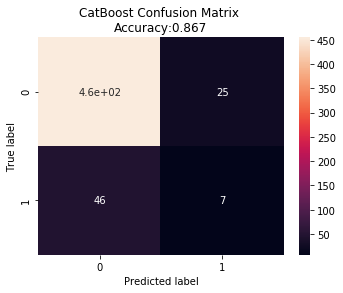

RMSE: 	 1.4580235443770362
r2: 	 0.04727735212840134
Accuracy: 	 0.8667917448405253
Recall: 	 0.1320754716981132
Precision: 	 0.21875
Specificity: 	 0.9479166666666666
NPV: 	 0.908183632734531
F1: 		 0.1647058823529412


In [0]:
ls_upsample_result = []
svm_upsample_result = []
br_upsample_result = []
rf_upsample_result = []
cat_upsample_result = []

for i in range(4):
  # Split the data: one-hot encoding
  X_oh_train = X_oh.iloc[gkf_modeling[i][0],]
  X_oh_test = X_oh.iloc[gkf_modeling[i][1],]
  y_oh_train = y_oh.iloc[gkf_modeling[i][0],]
  y_oh_test = y_oh.iloc[gkf_modeling[i][1],]

  # Split the data: categorical
  X_cat_train = X_cat.iloc[gkf_modeling[1][0],]
  X_cat_test = X_cat.iloc[gkf_modeling[1][1],]
  y_cat_train = y_cat.iloc[gkf_modeling[1][0],]
  y_cat_test = y_cat.iloc[gkf_modeling[1][1],]
  
  # Upsample and Scale
  X_oh_upsample_train_scaled, y_oh_upsample_train, X_oh_test_scaled = upsample_data_with_oh(X_oh_train, y_oh_train, X_oh_test)
  X_cat_upsample_train, y_cat_upsample_train = upsample_data_with_cat(X_cat_train, y_cat_train)

  # Lasso
  ls_res = model_eval(Lasso(max_iter=20000), 'Lasso', 'up')
  ls_upsample_result.append(ls_res)
  # SVM
  svm_res = model_eval(svm.SVR(), 'SVM', 'up')
  svm_upsample_result.append(svm_res)
  # Bayesian Ridge
  br_res = model_eval(BayesianRidge(), 'Bayesian Ridge', 'up')
  br_upsample_result.append(br_res)
  # Random Forest
  rf_res = model_eval(RandomForestRegressor(), 'Random Forest', 'up')
  rf_upsample_result.append(rf_res)
  # CatBoost
  cat_res = model_eval('God bless this model', 'CatBoost', 'up')
  cat_upsample_result.append(cat_res)

ii. Post Processing

In [0]:
ls_avg_eval = np.mean(ls_upsample_result, axis=0)
ls_avg_eval = np.append('Lasso', ls_avg_eval)

svm_avg_eval = np.mean(svm_upsample_result, axis=0)
svm_avg_eval = np.append('SVM', svm_avg_eval)

br_avg_eval = np.mean(br_upsample_result, axis=0)
br_avg_eval = np.append('Bayesian Ridge', br_avg_eval)

rf_avg_eval = np.mean(rf_upsample_result, axis=0)
rf_avg_eval = np.append('Random Forest', rf_avg_eval)

cat_avg_eval = np.mean(cat_upsample_result, axis=0)
cat_avg_eval = np.append('CatBoost', cat_avg_eval)

data = [ls_avg_eval, svm_avg_eval, br_avg_eval, rf_avg_eval, cat_avg_eval]
cv_upsample_res = pd.DataFrame(data=data, columns=['model', 'RMSE', 'r2', 'accuracy', 'recall', 'precision', 'specificity', 'npv', 'f1'])

iii. Result

In [0]:
cv_upsample_res

,model,RMSE,r2,accuracy,recall,precision,specificity,npv,f1
0,Lasso,2.4555629517260487,-0.7579783408523934,0.8902869419791865,0.0,0.0,1.0,0.8902869419791865,0.0
1,SVM,1.8403430853043248,-0.30769891316739256,0.8241518575514191,0.12251129601416721,0.14386383855410403,0.9091399944974321,0.8938429194583091,0.10301787764474332
2,Bayesian Ridge,2.6781780640454875,-0.8958050901952253,0.7608301536775092,0.3143100827971331,0.4182737122753561,0.8133043684274884,0.9060090522915282,0.2109664017860739
3,Random Forest,1.8348026285642791,-0.31811681740724274,0.8424445404782483,0.10042384468143287,0.08691608102521703,0.9325469246759599,0.8943016028177393,0.09315870387890257
4,CatBoost,1.4580235443770362,0.04727735212840134,0.8667917448405253,0.1320754716981132,0.21875,0.9479166666666666,0.908183632734531,0.1647058823529412


### *Could further look into feature importance*

## 10.Under Sample Majority Class

### (1) Undersample for Data with categorical features

In [0]:
def undersample_data_with_cat(X_train, y_train):
  # concatenate our training data back together
  data_cat_to_sample = pd.concat([X_train, y_train], axis=1)

  # separate minority and majority classes
  unhappy_cat = data_cat_to_sample[data_cat_to_sample['valence_score'] < 0]
  happy_cat = data_cat_to_sample[data_cat_to_sample['valence_score'] >= 0]
  # downsample majority
  happy_cat_downsampled = resample(happy_cat,
                                  replace = False, # sample without replacement
                                  n_samples = len(unhappy_cat), # match minority n
                                  random_state = 27) # reproducible results

  # combine minority and downsampled majority
  downsampled_cat = pd.concat([happy_cat_downsampled, unhappy_cat])

  # checking counts
  print(downsampled_cat[downsampled_cat['valence_score']>=0].shape)
  print(downsampled_cat[downsampled_cat['valence_score']<0].shape)

  # Split train and test
  y_cat_downsample_train = downsampled_cat['valence_score']
  X_cat_downsample_train = downsampled_cat.drop('valence_score', axis=1)
  return X_cat_downsample_train, y_cat_downsample_train

X_cat_downsample_train, y_cat_downsample_train = undersample_data_with_cat(X_cat_train, y_cat_train)

(181, 162)
(181, 162)


### (2) Undersample for Data with one-hot encoding

In [0]:
def downsample_data_with_oh(X_train, y_train, X_test):
  # concatenate our training data back together
  data_oh_to_sample = pd.concat([X_oh_train, y_oh_train], axis=1)


  # separate minority and majority classes
  unhappy_oh = data_oh_to_sample[data_oh_to_sample['valence_score'] < 0]
  happy_oh = data_oh_to_sample[data_oh_to_sample['valence_score'] >= 0]


  # upsample minority
  happy_oh_downsampled = resample(happy_oh,
                            replace=True, # sample with replacement
                            n_samples=len(unhappy_oh), # match number in majority class
                            random_state=27) # reproducible results

  # combine majority and upsampled minority
  downsampled_oh = pd.concat([unhappy_oh, happy_oh_downsampled])

  # check new class counts
  print(downsampled_oh[downsampled_oh['valence_score']>=0].shape)
  print(downsampled_oh[downsampled_oh['valence_score']<0].shape)

  # Split train and test
  y_oh_downsample_train = downsampled_oh['valence_score']
  X_oh_downsample_train = downsampled_oh.drop('valence_score', axis=1)

  # Scale for logistic regression
  scaler = preprocessing.StandardScaler().fit(X_oh_downsample_train)
  X_oh_downsample_train_scaled = scaler.transform(X_oh_downsample_train)
  X_oh_test_scaled = scaler.transform(X_test)
  return X_oh_downsample_train_scaled, y_oh_downsample_train, X_oh_test_scaled


X_oh_downsample_train_scaled, y_oh_downsample_train, X_oh_test_scaled = downsample_data_with_oh(X_oh_train, y_oh_train, X_oh_test)


(171, 96)
(171, 96)


### (3) Lasso Regression

In [0]:
def model_eval(model, model_name, sample_type):
  if sample_type == 'up':
    X_cat_train = X_cat_upsample_train
    y_cat_train = y_cat_upsample_train
    X_oh_train = X_oh_upsample_train_scaled
    y_oh_train = y_oh_upsample_train
  elif sample_type == 'down':
    X_cat_train = X_cat_downsample_train
    y_cat_train = y_cat_downsample_train
    X_oh_train = X_oh_downsample_train_scaled
    y_oh_train = y_oh_downsample_train

  if model_name == 'CatBoost':
    cat = catboost.CatBoostRegressor(**params_2)
    cat.fit(X_cat_train, y_cat_train,
              eval_set = (X_cat_test, y_cat_test),
              cat_features = categorical_features_indices,
              use_best_model = True,
              plot=True)
    m_regr = cat.predict(X_cat_test)
    return eval(y_cat_test, m_regr, model_name)
  else:
    model.fit(X_oh_train, y_oh_train)
    m_regr = model.predict(X_oh_test_scaled)
    return eval(y_oh_test, m_regr, model_name)

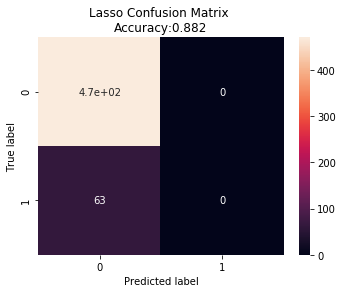

RMSE: 	 2.561196957544677
r2: 	 -0.6947642956978102
Accuracy: 	 0.8818011257035647
Recall: 	 0.0
Precision: 	 0.0
Specificity: 	 1.0
NPV: 	 0.8818011257035647
F1: 		 0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
ls = model_eval(Lasso(max_iter=20000), 'Lasso', 'down')

### (4) SVM

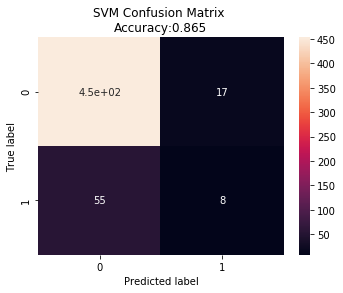

RMSE: 	 1.9898056626217526
r2: 	 -0.3166701539507992
Accuracy: 	 0.8649155722326454
Recall: 	 0.12698412698412698
Precision: 	 0.32
Specificity: 	 0.9638297872340426
NPV: 	 0.8917322834645669
F1: 		 0.18181818181818182


In [0]:
svm_ = model_eval(svm.SVR(), 'SVM', 'down')

### (5) Bayesian Ridge

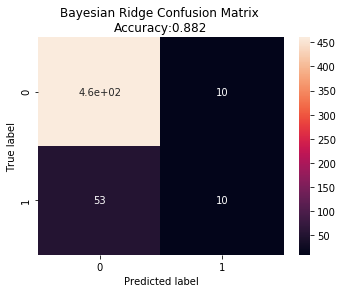

RMSE: 	 2.1026684876715747
r2: 	 -0.391352378464058
Accuracy: 	 0.8818011257035647
Recall: 	 0.15873015873015872
Precision: 	 0.5
Specificity: 	 0.9787234042553191
NPV: 	 0.8966861598440545
F1: 		 0.24096385542168675


In [0]:
br = model_eval(BayesianRidge(), 'Bayesian Ridge', 'down')

### (6) Random Forest

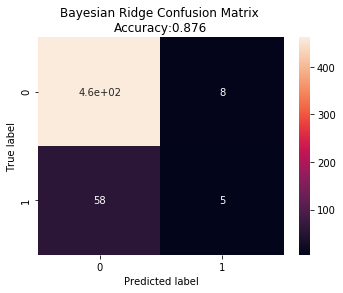

RMSE: 	 1.9091792995622263
r2: 	 -0.263319051450565
Accuracy: 	 0.8761726078799249
Recall: 	 0.07936507936507936
Precision: 	 0.38461538461538464
Specificity: 	 0.9829787234042553
NPV: 	 0.8884615384615384
F1: 		 0.13157894736842105


In [0]:
rf = model_eval(RandomForestRegressor(), 'Bayesian Ridge', 'down')

### (7) CatBoost

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 1.4737977	test: 1.6878646	best: 1.6878646 (0)	total: 55.2ms	remaining: 9m 12s
10:	learn: 1.4513645	test: 1.6780848	best: 1.6780848 (10)	total: 384ms	remaining: 5m 49s
20:	learn: 1.4288926	test: 1.6688615	best: 1.6688615 (20)	total: 649ms	remaining: 5m 8s
30:	learn: 1.4068212	test: 1.6582300	best: 1.6579242 (29)	total: 907ms	remaining: 4m 51s
40:	learn: 1.3869657	test: 1.6497555	best: 1.6497555 (40)	total: 1.17s	remaining: 4m 44s
50:	learn: 1.3676314	test: 1.6410225	best: 1.6407721 (48)	total: 1.43s	remaining: 4m 38s
60:	learn: 1.3513175	test: 1.6340289	best: 1.6336705 (59)	total: 1.68s	remaining: 4m 34s
70:	learn: 1.3349512	test: 1.6264750	best: 1.6264750 (70)	total: 1.95s	remaining: 4m 32s
80:	learn: 1.3212751	test: 1.6216528	best: 1.6216528 (80)	total: 2.19s	remaining: 4m 28s
90:	learn: 1.3072853	test: 1.6182586	best: 1.6182586 (90)	total: 2.45s	remaining: 4m 27s
100:	learn: 1.2965287	test: 1.6125403	best: 1.6124334 (99)	total: 2.71s	remaining: 4m 25s
110:	learn: 1.2828785	

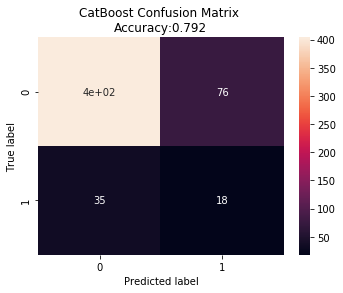

RMSE: 	 2.4032110447955226
r2: 	 -0.5703406154323294
Accuracy: 	 0.7917448405253283
Recall: 	 0.33962264150943394
Precision: 	 0.19148936170212766
Specificity: 	 0.8416666666666667
NPV: 	 0.9202733485193622
F1: 		 0.24489795918367346


In [0]:
cat = model_eval('wow here I can type anything', 'CatBoost', 'down')

### (8) Cross Validation

i. Cross Validation

(185, 96)
(185, 96)
(181, 162)
(181, 162)


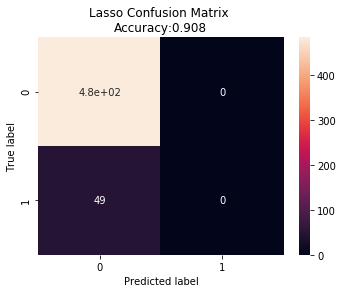

RMSE: 	 2.279643636956118
r2: 	 -0.9572709910591031
Accuracy: 	 0.9082397003745318
Recall: 	 0.0
Precision: 	 0.0
Specificity: 	 1.0
NPV: 	 0.9082397003745318
F1: 		 0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


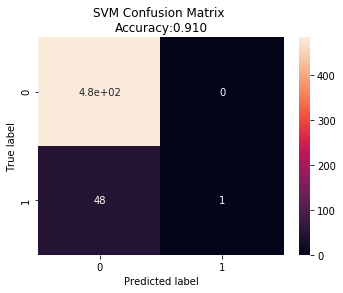

RMSE: 	 1.2489020463153344
r2: 	 -0.07229029410547749
Accuracy: 	 0.9101123595505618
Recall: 	 0.02040816326530612
Precision: 	 1.0
Specificity: 	 1.0
NPV: 	 0.9099437148217636
F1: 		 0.039999999999999994


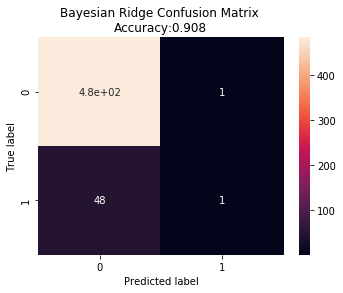

RMSE: 	 1.48240126880958
r2: 	 -0.27276954762296035
Accuracy: 	 0.9082397003745318
Recall: 	 0.02040816326530612
Precision: 	 0.5
Specificity: 	 0.9979381443298969
NPV: 	 0.9097744360902256
F1: 		 0.039215686274509796


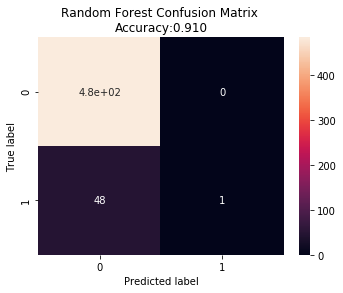

RMSE: 	 1.3699807532251354
r2: 	 -0.17624682346281717
Accuracy: 	 0.9101123595505618
Recall: 	 0.02040816326530612
Precision: 	 1.0
Specificity: 	 1.0
NPV: 	 0.9099437148217636
F1: 		 0.039999999999999994


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 1.4737977	test: 1.6878646	best: 1.6878646 (0)	total: 34.9ms	remaining: 5m 48s
10:	learn: 1.4513645	test: 1.6780848	best: 1.6780848 (10)	total: 437ms	remaining: 6m 37s
20:	learn: 1.4288926	test: 1.6688615	best: 1.6688615 (20)	total: 705ms	remaining: 5m 35s
30:	learn: 1.4068212	test: 1.6582300	best: 1.6579242 (29)	total: 981ms	remaining: 5m 15s
40:	learn: 1.3869657	test: 1.6497555	best: 1.6497555 (40)	total: 1.27s	remaining: 5m 9s
50:	learn: 1.3676314	test: 1.6410225	best: 1.6407721 (48)	total: 1.55s	remaining: 5m 1s
60:	learn: 1.3513175	test: 1.6340289	best: 1.6336705 (59)	total: 1.82s	remaining: 4m 56s
70:	learn: 1.3349512	test: 1.6264750	best: 1.6264750 (70)	total: 2.11s	remaining: 4m 55s
80:	learn: 1.3212751	test: 1.6216528	best: 1.6216528 (80)	total: 2.38s	remaining: 4m 51s
90:	learn: 1.3072853	test: 1.6182586	best: 1.6182586 (90)	total: 2.66s	remaining: 4m 50s
100:	learn: 1.2965287	test: 1.6125403	best: 1.6124334 (99)	total: 2.93s	remaining: 4m 47s
110:	learn: 1.2828785	t

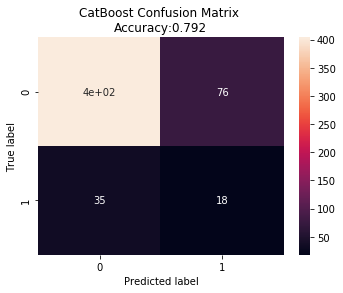

RMSE: 	 2.4032110447955226
r2: 	 -0.5703406154323294
Accuracy: 	 0.7917448405253283
Recall: 	 0.33962264150943394
Precision: 	 0.19148936170212766
Specificity: 	 0.8416666666666667
NPV: 	 0.9202733485193622
F1: 		 0.24489795918367346
(181, 96)
(181, 96)
(181, 162)
(181, 162)


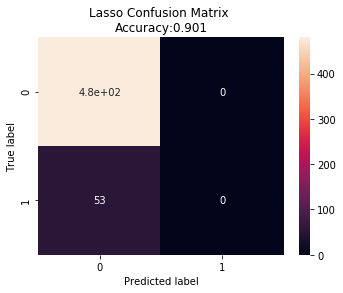

RMSE: 	 2.760006287315305
r2: 	 -0.8034828781292433
Accuracy: 	 0.900562851782364
Recall: 	 0.0
Precision: 	 0.0
Specificity: 	 1.0
NPV: 	 0.900562851782364
F1: 		 0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


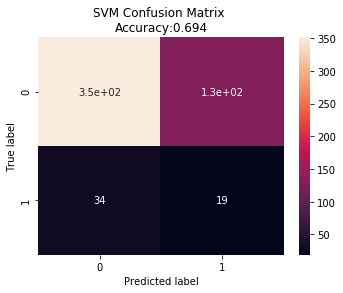

RMSE: 	 2.7805365506625117
r2: 	 -0.8168980571454432
Accuracy: 	 0.6941838649155723
Recall: 	 0.3584905660377358
Precision: 	 0.12837837837837837
Specificity: 	 0.73125
NPV: 	 0.9116883116883117
F1: 		 0.1890547263681592


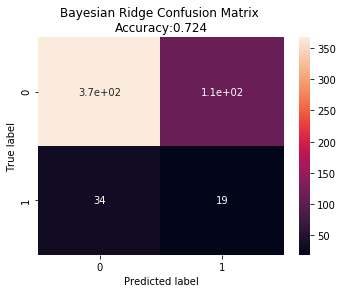

RMSE: 	 2.6961092462403795
r2: 	 -0.7617303574660232
Accuracy: 	 0.724202626641651
Recall: 	 0.3584905660377358
Precision: 	 0.14393939393939395
Specificity: 	 0.7645833333333333
NPV: 	 0.9152119700748129
F1: 		 0.2054054054054054


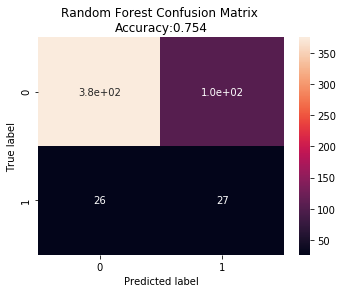

RMSE: 	 2.6713091307066916
r2: 	 -0.7455251104177858
Accuracy: 	 0.7542213883677298
Recall: 	 0.5094339622641509
Precision: 	 0.20454545454545456
Specificity: 	 0.78125
NPV: 	 0.9351620947630923
F1: 		 0.2918918918918919


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 1.4737977	test: 1.6878646	best: 1.6878646 (0)	total: 53.5ms	remaining: 8m 55s
10:	learn: 1.4513645	test: 1.6780848	best: 1.6780848 (10)	total: 423ms	remaining: 6m 24s
20:	learn: 1.4288926	test: 1.6688615	best: 1.6688615 (20)	total: 675ms	remaining: 5m 20s
30:	learn: 1.4068212	test: 1.6582300	best: 1.6579242 (29)	total: 930ms	remaining: 4m 59s
40:	learn: 1.3869657	test: 1.6497555	best: 1.6497555 (40)	total: 1.2s	remaining: 4m 52s
50:	learn: 1.3676314	test: 1.6410225	best: 1.6407721 (48)	total: 1.47s	remaining: 4m 46s
60:	learn: 1.3513175	test: 1.6340289	best: 1.6336705 (59)	total: 1.72s	remaining: 4m 40s
70:	learn: 1.3349512	test: 1.6264750	best: 1.6264750 (70)	total: 1.99s	remaining: 4m 38s
80:	learn: 1.3212751	test: 1.6216528	best: 1.6216528 (80)	total: 2.22s	remaining: 4m 32s
90:	learn: 1.3072853	test: 1.6182586	best: 1.6182586 (90)	total: 2.48s	remaining: 4m 29s
100:	learn: 1.2965287	test: 1.6125403	best: 1.6124334 (99)	total: 2.73s	remaining: 4m 27s
110:	learn: 1.2828785	

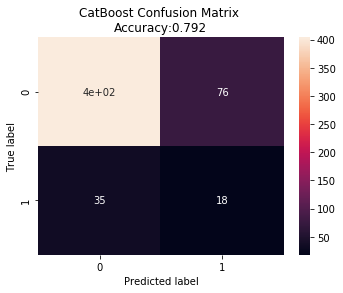

RMSE: 	 2.4032110447955226
r2: 	 -0.5703406154323294
Accuracy: 	 0.7917448405253283
Recall: 	 0.33962264150943394
Precision: 	 0.19148936170212766
Specificity: 	 0.8416666666666667
NPV: 	 0.9202733485193622
F1: 		 0.24489795918367346
(165, 96)
(165, 96)
(181, 162)
(181, 162)


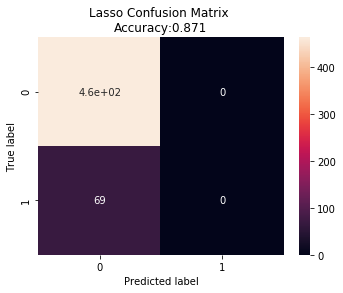

RMSE: 	 2.0418488464534286
r2: 	 -0.46922529311073835
Accuracy: 	 0.8705440900562852
Recall: 	 0.0
Precision: 	 0.0
Specificity: 	 1.0
NPV: 	 0.8705440900562852
F1: 		 0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


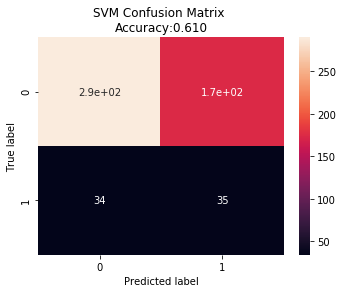

RMSE: 	 2.654341727064104
r2: 	 -0.9099484316557469
Accuracy: 	 0.6097560975609756
Recall: 	 0.5072463768115942
Precision: 	 0.1674641148325359
Specificity: 	 0.625
NPV: 	 0.8950617283950617
F1: 		 0.2517985611510792


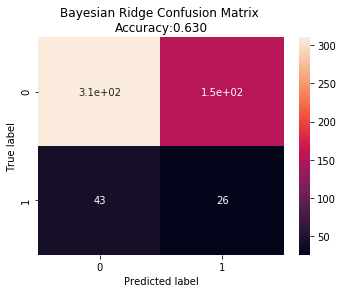

RMSE: 	 2.565772194606954
r2: 	 -0.8462176625975655
Accuracy: 	 0.6303939962476548
Recall: 	 0.37681159420289856
Precision: 	 0.14444444444444443
Specificity: 	 0.6681034482758621
NPV: 	 0.8781869688385269
F1: 		 0.2088353413654618


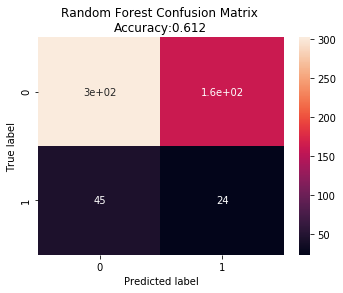

RMSE: 	 2.5402944548676256
r2: 	 -0.8278849933104475
Accuracy: 	 0.6116322701688556
Recall: 	 0.34782608695652173
Precision: 	 0.12903225806451613
Specificity: 	 0.6508620689655172
NPV: 	 0.8703170028818443
F1: 		 0.18823529411764706


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 1.4737977	test: 1.6878646	best: 1.6878646 (0)	total: 69.1ms	remaining: 11m 31s
10:	learn: 1.4513645	test: 1.6780848	best: 1.6780848 (10)	total: 415ms	remaining: 6m 17s
20:	learn: 1.4288926	test: 1.6688615	best: 1.6688615 (20)	total: 668ms	remaining: 5m 17s
30:	learn: 1.4068212	test: 1.6582300	best: 1.6579242 (29)	total: 929ms	remaining: 4m 58s
40:	learn: 1.3869657	test: 1.6497555	best: 1.6497555 (40)	total: 1.2s	remaining: 4m 51s
50:	learn: 1.3676314	test: 1.6410225	best: 1.6407721 (48)	total: 1.47s	remaining: 4m 46s
60:	learn: 1.3513175	test: 1.6340289	best: 1.6336705 (59)	total: 1.73s	remaining: 4m 41s
70:	learn: 1.3349512	test: 1.6264750	best: 1.6264750 (70)	total: 2s	remaining: 4m 40s
80:	learn: 1.3212751	test: 1.6216528	best: 1.6216528 (80)	total: 2.25s	remaining: 4m 35s
90:	learn: 1.3072853	test: 1.6182586	best: 1.6182586 (90)	total: 2.52s	remaining: 4m 34s
100:	learn: 1.2965287	test: 1.6125403	best: 1.6124334 (99)	total: 2.78s	remaining: 4m 32s
110:	learn: 1.2828785	te

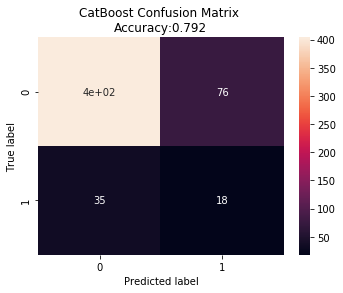

RMSE: 	 2.4032110447955226
r2: 	 -0.5703406154323294
Accuracy: 	 0.7917448405253283
Recall: 	 0.33962264150943394
Precision: 	 0.19148936170212766
Specificity: 	 0.8416666666666667
NPV: 	 0.9202733485193622
F1: 		 0.24489795918367346
(171, 96)
(171, 96)
(181, 162)
(181, 162)


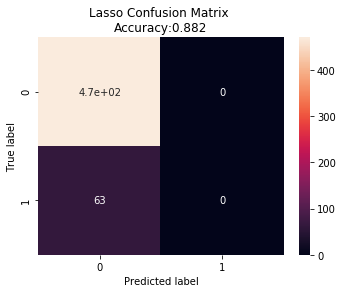

RMSE: 	 2.561196957544677
r2: 	 -0.6947642956978102
Accuracy: 	 0.8818011257035647
Recall: 	 0.0
Precision: 	 0.0
Specificity: 	 1.0
NPV: 	 0.8818011257035647
F1: 		 0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


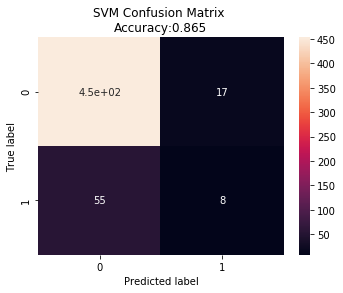

RMSE: 	 1.9898056626217526
r2: 	 -0.3166701539507992
Accuracy: 	 0.8649155722326454
Recall: 	 0.12698412698412698
Precision: 	 0.32
Specificity: 	 0.9638297872340426
NPV: 	 0.8917322834645669
F1: 		 0.18181818181818182


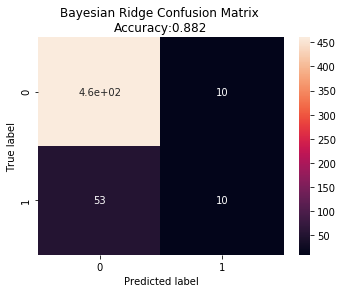

RMSE: 	 2.1026684876715747
r2: 	 -0.391352378464058
Accuracy: 	 0.8818011257035647
Recall: 	 0.15873015873015872
Precision: 	 0.5
Specificity: 	 0.9787234042553191
NPV: 	 0.8966861598440545
F1: 		 0.24096385542168675


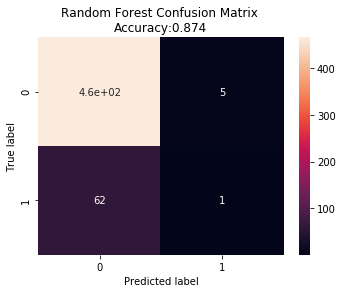

RMSE: 	 1.8861087137794454
r2: 	 -0.24805306226128643
Accuracy: 	 0.874296435272045
Recall: 	 0.015873015873015872
Precision: 	 0.16666666666666666
Specificity: 	 0.9893617021276596
NPV: 	 0.8823529411764706
F1: 		 0.028985507246376812


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 1.4737977	test: 1.6878646	best: 1.6878646 (0)	total: 46.2ms	remaining: 7m 42s
10:	learn: 1.4513645	test: 1.6780848	best: 1.6780848 (10)	total: 427ms	remaining: 6m 27s
20:	learn: 1.4288926	test: 1.6688615	best: 1.6688615 (20)	total: 677ms	remaining: 5m 21s
30:	learn: 1.4068212	test: 1.6582300	best: 1.6579242 (29)	total: 945ms	remaining: 5m 4s
40:	learn: 1.3869657	test: 1.6497555	best: 1.6497555 (40)	total: 1.21s	remaining: 4m 54s
50:	learn: 1.3676314	test: 1.6410225	best: 1.6407721 (48)	total: 1.47s	remaining: 4m 47s
60:	learn: 1.3513175	test: 1.6340289	best: 1.6336705 (59)	total: 1.73s	remaining: 4m 41s
70:	learn: 1.3349512	test: 1.6264750	best: 1.6264750 (70)	total: 1.98s	remaining: 4m 37s
80:	learn: 1.3212751	test: 1.6216528	best: 1.6216528 (80)	total: 2.23s	remaining: 4m 32s
90:	learn: 1.3072853	test: 1.6182586	best: 1.6182586 (90)	total: 2.48s	remaining: 4m 30s
100:	learn: 1.2965287	test: 1.6125403	best: 1.6124334 (99)	total: 2.75s	remaining: 4m 29s
110:	learn: 1.2828785	

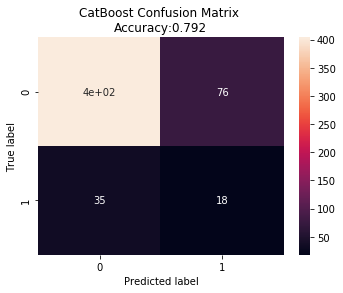

RMSE: 	 2.4032110447955226
r2: 	 -0.5703406154323294
Accuracy: 	 0.7917448405253283
Recall: 	 0.33962264150943394
Precision: 	 0.19148936170212766
Specificity: 	 0.8416666666666667
NPV: 	 0.9202733485193622
F1: 		 0.24489795918367346


In [0]:
ls_downsample_result = []
svm_downsample_result = []
br_downsample_result = []
rf_downsample_result = []
cat_downsample_result = []

for i in range(4):
  # Split the data: one-hot encoding
  X_oh_train = X_oh.iloc[gkf_modeling[i][0],]
  X_oh_test = X_oh.iloc[gkf_modeling[i][1],]
  y_oh_train = y_oh.iloc[gkf_modeling[i][0],]
  y_oh_test = y_oh.iloc[gkf_modeling[i][1],]

  # Split the data: categorical
  X_cat_train = X_cat.iloc[gkf_modeling[1][0],]
  X_cat_test = X_cat.iloc[gkf_modeling[1][1],]
  y_cat_train = y_cat.iloc[gkf_modeling[1][0],]
  y_cat_test = y_cat.iloc[gkf_modeling[1][1],]
  
  # Upsample and Scale
  X_oh_downsample_train_scaled, y_oh_downsample_train, X_oh_test_scaled = downsample_data_with_oh(X_oh_train, y_oh_train, X_oh_test)
  X_cat_downsample_train, y_cat_downsample_train = undersample_data_with_cat(X_cat_train, y_cat_train)
  
  # Lasso
  ls_res = model_eval(Lasso(max_iter=20000), 'Lasso', 'down')
  ls_downsample_result.append(ls_res)
  # SVM
  svm_res = model_eval(svm.SVR(), 'SVM', 'down')
  svm_downsample_result.append(svm_res)
  # Bayesian Ridge
  br_res = model_eval(BayesianRidge(), 'Bayesian Ridge', 'down')
  br_downsample_result.append(br_res)
  # Random Forest
  rf_res = model_eval(RandomForestRegressor(), 'Random Forest', 'down')
  rf_downsample_result.append(rf_res)
  # CatBoost
  cat_res = model_eval('God bless this model', 'CatBoost', 'down')
  cat_downsample_result.append(cat_res)
  

ii. Post processing

In [0]:
ls_avg_eval = np.mean(ls_downsample_result, axis=0)
ls_avg_eval = np.append('Lasso', ls_avg_eval)

svm_avg_eval = np.mean(svm_downsample_result, axis=0)
svm_avg_eval = np.append('SVM', svm_avg_eval)

br_avg_eval = np.mean(br_downsample_result, axis=0)
br_avg_eval = np.append('Bayesian Ridge', br_avg_eval)

rf_avg_eval = np.mean(rf_downsample_result, axis=0)
rf_avg_eval = np.append('Random Forest', rf_avg_eval)

cat_avg_eval = np.mean(cat_downsample_result, axis=0)
cat_avg_eval = np.append('CatBoost', cat_avg_eval)

data = [ls_avg_eval, svm_avg_eval, br_avg_eval, rf_avg_eval, cat_avg_eval]
cv_downsample_res = pd.DataFrame(data=data, columns=['model', 'RMSE', 'r2', 'accuracy', 'recall', 'precision', 'specificity', 'npv', 'f1'])

iii. Result

In [0]:
cv_downsample_res

,model,RMSE,r2,accuracy,recall,precision,specificity,npv,f1
0,Lasso,2.410673932067382,-0.7311858644992237,0.8902869419791865,0.0,0.0,1.0,0.8902869419791865,0.0
1,SVM,2.1683964966659257,-0.5289517342143667,0.7697419735649387,0.2532823082746908,0.4039606233027286,0.8300199468085107,0.9021065095924259,0.16566786733435507
2,Bayesian Ridge,2.2117377993321217,-0.5680174865376517,0.7861593622418506,0.22861012055902483,0.3220959595959596,0.8523370825486029,0.899964883711905,0.17360507211676593
3,Random Forest,2.1169232631447246,-0.4994274973630842,0.7875656133397981,0.22338530708974869,0.37506109481915934,0.8553684427732943,0.8994439384107927,0.13727817331397893
4,CatBoost,2.4032110447955226,-0.5703406154323294,0.7917448405253283,0.33962264150943394,0.19148936170212766,0.8416666666666667,0.9202733485193622,0.24489795918367346


## 11.Conclusion

1. Over Sample Minority + CatBoost gives best performance:

* Recall: 	 0.5714285714285714
* Precision: 	 0.4195804195804196
* AUC: 0.71
2. The top 3 important features are:
* Ethnicity	16.765079
* LAP_actual	11.967100
* Neuroticism	8.503524
3. Under sample majority in helps logistic regression and random forest improve accuracy.